<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230624_DD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

In [6]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):

    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""

        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        #self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, 50))
            self.fc2.append(nn.Linear(50, 1))
            #self.fc3.append(nn.Linear(5, 1))

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1)))
            #h1 = F.relu(self.fc2[i](h0))
            #h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = self.fc2[i](h0)
            h2 = self.fc2[i](h0)
            pxy.append(h2)

        return torch.cat(pxy, dim=1)


In [7]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).

    This class is for defining the structure of FR-Train generator (classifier).
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """

    def __init__(self):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(5, 20),
            nn.ReLU(),
            nn.Linear(20, 5),
            nn.ReLU(),
            nn.Linear(5, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [8]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

def test_model(model_,model2_, tX, ty, s1):
    model_.eval()

    if model2_ == None:
        ax = tX[:,0:5]
    else:
        model2_.eval()
        ax = model2_(tX[:,0:5],tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)

    f1 = f1_score(ty.cpu().data.numpy(),y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(tX[:,4].cpu().data.numpy(),columns=['z0']), y_hat, discrete_features="auto")
    mi = mi_scores['z0']
    print("Test f1 score: {}".format(f1))
    print("Mutual Information y_hat^,z0 = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [9]:

def test_all_data(generator,adapter,train_x, XT,yT, ShowChart = False,bucket_size_array=[200]):

    #XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    #yT = y[train_size:]

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('XT.shape',XT.shape)

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        MISS = {}
        DRF = {}
        for col in columns:
            MISS[col] = []
            DRF[col] = []

        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
            tmp_y = yT[bk*bucket_size:bk*bucket_size+bucket_size]
            if adapter == None:
                xs = tmp_x[:,0:5]
            else:
                xs = adapter(tmp_x[:,0:5],tmp_x[:,5].reshape(-1,1)/avaible_range)
            predicted_y = generator(xs)
            predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
            f1 = f1_score(tmp_y,predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)

            cpu_xs = xs.cpu().data.numpy()
            mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), tmp_y, discrete_features="auto")
            ks = __ks_drift(train_x.values,cpu_xs)
            for ix,col in enumerate(columns):
                MISS[col].append(mi_scores[col])
                DRF[col].append(ks[:,0][ix])

        df_mis = pd.DataFrame(MISS)
        df_drf = pd.DataFrame(DRF)

        if ShowChart:
            plt.figure(figsize=main_figsize)
            plt.plot(f1s,linewidth=1)
            plt.ylabel('F1 Score')
            plt.xlabel(f'bucket ({bucket_size})')
            plt.show()

            df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
            plt.legend(loc=1,ncol=5)
            plt.show()

            df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({bucket_size})',fontsize=15)
            plt.legend(loc=1,ncol=5)
            plt.show()

        print(f'mean of drift:\n{df_drf.mean()}')

    print('Mean F1 for all data:',np.mean(f1s))
    return f1s, df_mis, df_drf

In [10]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha, ShowChart = False):
    seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch


    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss()  # mean square error

    # Initializes generator and discriminator
    generator = Generator().to(device)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5).to(device)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    #mine = Net()
    #optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.001)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
            ml = mse_loss(xs, XS_train[:,0:5])
            a_loss = torch.sum(ml) #* torch.std(ml)
        else:
            xs = XS_train[:,0:5]
            a_loss = torch.tensor(0)

        a_losses.append(a_loss.cpu().data.numpy())
        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_losses.append(g_loss.cpu().data.numpy())

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        if lambda_f >= 0.0:
            loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05
        else:
            loss = g_loss

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )

        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator,adapter, XS_test, y_test, s1_test)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Adapter loss':a_losses,'Classifier loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({bucket_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(a_losses,linewidth=1,label='Adapter loss')
    plt.plot(g_losses,linewidth=1,label='classifier loss')
    plt.ylabel('loss')
    plt.xlabel(f'bucket ({bucket_size})')
    plt.legend(loc=1,ncol=2)
    plt.show()
    '''
    return f1,mi,generator,adapter,df_loss

In [11]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [12]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

In [13]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [14]:
seed_everything()

y= (np.random.normal(0.5,0.5,100) > 0.5).astype(int)
sum(y)

40

In [15]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [16]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### KS-test 통계량의 측정

In [17]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
mi_scores = make_mi_scores(X, y, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
x1    0.079411
x0    0.050887
z0    0.027068
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 63.50it/s]


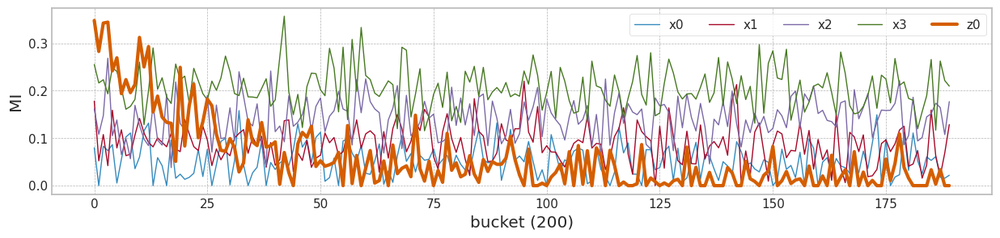

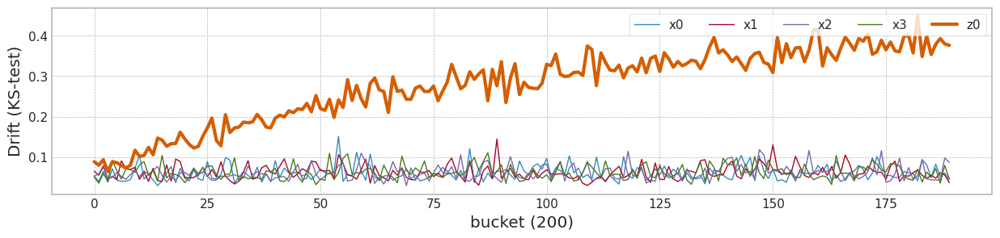

In [18]:
from tqdm import tqdm

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c1 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:1800]), scaler_c1.transform(X[1800:])),axis=0), columns=columns)


for bucket_size in bucket_size_array:
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x.shape[0]-2000)/bucket_size)

    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X[bk*bucket_size:bk*bucket_size+bucket_size], y[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X[0:1800].values,X[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    '''
    df_mis['x0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x1'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x2'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x3'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['z0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

+ 2000개를 학습하고, 이후 38000개를 추정한다.

cuda:0


100%|██████████| 1000/1000 [00:25<00:00, 39.89it/s]


MSE: 0.25
RMSE: 0.50


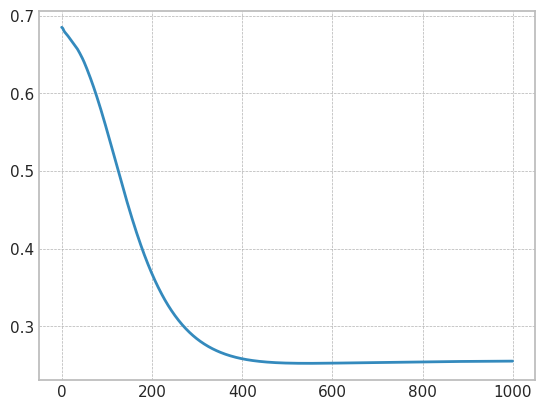

feature 5, test_f1 0.8636363636363636


In [19]:
import copy
import torch.optim as optim

seed_everything()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Convert to 2D PyTorch tensors
X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
).to(device)

# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)

n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())

# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 189/189 [00:00<00:00, 467.77it/s]


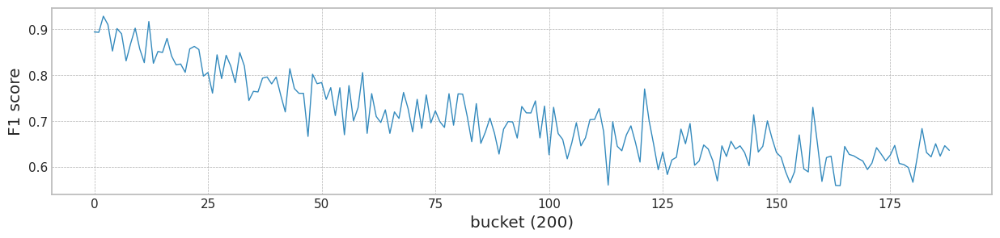

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Case #1 Feature 5,0.863636,0.894009,0.70725,0.636364,0.0


In [20]:

XT = X[2000:][['x0','x1','x2','x3','z0']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({bucket_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Case #1 Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

### 내성 학습의 적용

In [21]:

# bucket 하나의 크기는 100
# 2000개의 학습데이터에는 20개의 bucket이 있음.
# 학습데이터 100개당 +1의 bucket count를 증가 시킴
X['b'] = [int(b) for b in X.index.values/100]
X

,x0,x1,x2,x3,z0,b
0,0.511187,0.348595,0.564807,0.482506,0.395084,0
1,0.435937,0.524656,0.595436,0.762536,0.606272,0
2,0.479071,0.682932,0.738867,0.596141,0.688060,0
3,0.572894,0.251745,0.392850,0.522275,0.344350,0
4,0.562890,0.613393,0.481594,0.596584,0.670729,0
...,...,...,...,...,...,...
39995,0.332800,0.214564,0.468946,0.614324,-0.069684,399
39996,0.414601,0.252607,0.438192,0.601093,0.984518,399
39997,0.361400,0.558191,0.590386,0.612855,0.528420,399
39998,0.459619,0.212723,0.148134,0.664097,2.043499,399


lambda_f2 1.0
cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.696380]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.681345]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.668415]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.654487]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.638451]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.618187]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.594688]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.568330]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.539704]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.509774]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.479563]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.450001]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.421808

100%|██████████| 189/189 [00:03<00:00, 55.55it/s]


mean of drift:
x0    0.061049
x1    0.062651
x2    0.061975
x3    0.063260
z0    0.276490
dtype: float64
Mean F1 for all data: 0.7043884044703137
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 2.436126] [G loss: 0.635592]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 28.395292] [G loss: 0.426569]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 107.542900] [G loss: 0.269865]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 180.970139] [G loss: 0.231923]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 228.348465] [G loss: 0.226037]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 256.693268] [G loss: 0.225071]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 276.360718] [G loss: 0.224795]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 290.089508] [G loss: 0.224625]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 300.561676] [G loss: 0.224464]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 308.678833] [G loss: 0.224354]
[Lambda: 0.0

100%|██████████| 189/189 [00:03<00:00, 51.62it/s]


mean of drift:
x0    1.000000
x1    0.999971
x2    1.000000
x3    0.999941
z0    0.997252
dtype: float64
Mean F1 for all data: 0.7509869523519865
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.014843] [G loss: 0.685470]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.099060] [G loss: 0.616528]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.265243] [G loss: 0.527588]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.352175] [G loss: 0.458954]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.444123] [G loss: 0.389163]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.460424] [G loss: 0.338713]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.429851] [G loss: 0.306039]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.388714] [G loss: 0.284035]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.345293] [G loss: 0.268969]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.306162] [G loss: 0.257970]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.63it/s]


mean of drift:
x0    0.960056
x1    0.730579
x2    0.907613
x3    0.359974
z0    0.786805
dtype: float64
Mean F1 for all data: 0.6777414432098562
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.007045] [G loss: 0.686397]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.028435] [G loss: 0.653232]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.071865] [G loss: 0.595135]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.115450] [G loss: 0.529989]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.150051] [G loss: 0.465347]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.188813] [G loss: 0.397029]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.199763] [G loss: 0.344234]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.185764] [G loss: 0.311440]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.168264] [G loss: 0.289185]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.150881] [G loss: 0.273424]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.89it/s]


mean of drift:
x0    0.601573
x1    0.932090
x2    0.886143
x3    0.324824
z0    0.642163
dtype: float64
Mean F1 for all data: 0.686360099962819
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.004989] [G loss: 0.687391]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.011853] [G loss: 0.661610]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.033902] [G loss: 0.612607]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.058340] [G loss: 0.552422]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.075833] [G loss: 0.493737]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.092787] [G loss: 0.432781]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.106224] [G loss: 0.376405]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.106315] [G loss: 0.336421]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.100256] [G loss: 0.308521]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.091606] [G loss: 0.288654]
[Lambda: 0.300000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 53.47it/s]


mean of drift:
x0    0.918616
x1    0.902569
x2    0.709133
x3    0.536987
z0    0.559080
dtype: float64
Mean F1 for all data: 0.6961814295162821
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.004168] [G loss: 0.688089]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.005628] [G loss: 0.666762]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.017563] [G loss: 0.625900]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.032100] [G loss: 0.570251]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.043463] [G loss: 0.513748]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.052828] [G loss: 0.457984]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.061682] [G loss: 0.402249]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.064733] [G loss: 0.357981]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.063023] [G loss: 0.326010]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.058626] [G loss: 0.303664]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.88it/s]


mean of drift:
x0    0.958075
x1    0.883689
x2    0.885379
x3    0.336185
z0    0.465456
dtype: float64
Mean F1 for all data: 0.6839972204059732
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.003746] [G loss: 0.688671]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.002914] [G loss: 0.670211]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.008857] [G loss: 0.636123]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.017396] [G loss: 0.585392]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.025617] [G loss: 0.530459]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.031786] [G loss: 0.476634]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.036859] [G loss: 0.423724]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.039903] [G loss: 0.377657]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.040309] [G loss: 0.342083]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.038566] [G loss: 0.316265]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.54it/s]


mean of drift:
x0    0.857072
x1    0.412137
x2    0.681520
x3    0.409274
z0    0.482534
dtype: float64
Mean F1 for all data: 0.7014752749527918
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003537] [G loss: 0.689122]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.001622] [G loss: 0.672693]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.004125] [G loss: 0.645882]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.008982] [G loss: 0.599748]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.014390] [G loss: 0.547458]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.018978] [G loss: 0.493924]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.022431] [G loss: 0.442958]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.024332] [G loss: 0.396405]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.025149] [G loss: 0.358766]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.024396] [G loss: 0.330204]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 52.60it/s]


mean of drift:
x0    0.236314
x1    0.400723
x2    0.152084
x3    0.228225
z0    0.520750
dtype: float64
Mean F1 for all data: 0.7489205874881972
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003453] [G loss: 0.689524]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.000998] [G loss: 0.674563]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001586] [G loss: 0.654792]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.003907] [G loss: 0.618496]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.006840] [G loss: 0.573643]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.010015] [G loss: 0.523989]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.012632] [G loss: 0.474067]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.014408] [G loss: 0.427435]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.015125] [G loss: 0.386471]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.015075] [G loss: 0.354314]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 51.76it/s]


mean of drift:
x0    0.748342
x1    0.387228
x2    0.131193
x3    0.227822
z0    0.371076
dtype: float64
Mean F1 for all data: 0.7290763788681796
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.003432] [G loss: 0.689806]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000733] [G loss: 0.675888]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000502] [G loss: 0.660039]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.001147] [G loss: 0.636760]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.002287] [G loss: 0.605552]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.003701] [G loss: 0.566868]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.005325] [G loss: 0.522408]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.006794] [G loss: 0.476705]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.007791] [G loss: 0.433888]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.008257] [G loss: 0.394770]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.01it/s]


mean of drift:
x0    0.182116
x1    0.315138
x2    0.311843
x3    0.181969
z0    0.307293
dtype: float64
Mean F1 for all data: 0.785573510298825
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 0.531513] [G loss: 0.695597]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.003443] [G loss: 0.690029]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000645] [G loss: 0.676885]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000147] [G loss: 0.663143]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000246] [G loss: 0.643746]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000465] [G loss: 0.619239]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000810] [G loss: 0.588393]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.001255] [G loss: 0.551900]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.001713] [G loss: 0.512323]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.002153] [G loss: 0.472185]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.002467] [G loss: 0.434540]
[Lambda: 0.900000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 55.62it/s]


mean of drift:
x0    0.208613
x1    0.228745
x2    0.217860
x3    0.142769
z0    0.268821
dtype: float64
Mean F1 for all data: 0.8086595962530375


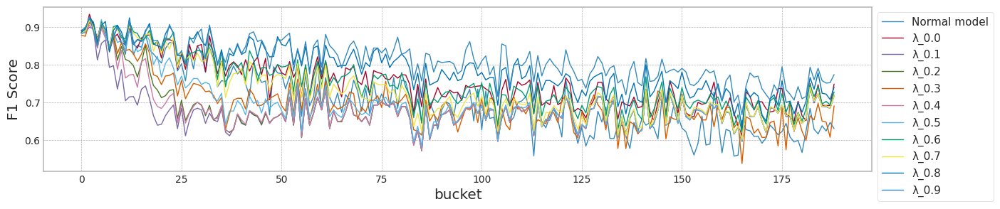

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #1, Normal model  0.866667  0.889908  0.704388  0.630137  0.258548
1                     0.0  0.865169  0.889908  0.750987  0.748252  0.263942
2                     0.1  0.877778  0.881818  0.677741  0.717949  0.213712
3                     0.2  0.868132  0.885845  0.686360  0.717949  0.207418
4                     0.3  0.872928  0.877828  0.696181  0.690476  0.220889
5                     0.4  0.868132  0.882883  0.683997  0.717949  0.237245
6                     0.5  0.879121  0.881818  0.701475  0.717949  0.260430
7                     0.6  0.882682  0.885845  0.748921  0.727273  0.267588
8                     0.7  0.877778  0.885845  0.729076  0.717949  0.266995
9                     0.8  0.874317  0.885845  0.785574  0.740000  0.223350
10                    0.9  0.883978  0.890909  0.808660  0.773519  0.252403
max_mean_lambda= 0.9


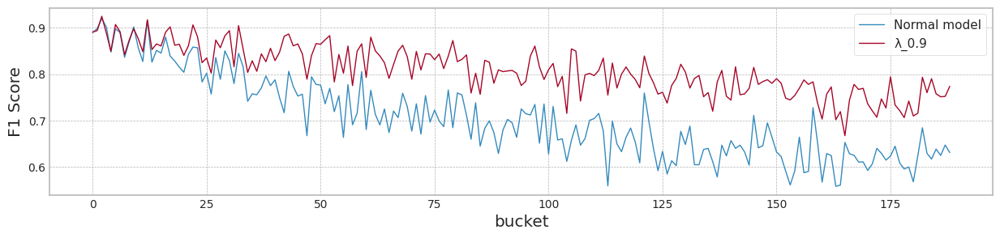

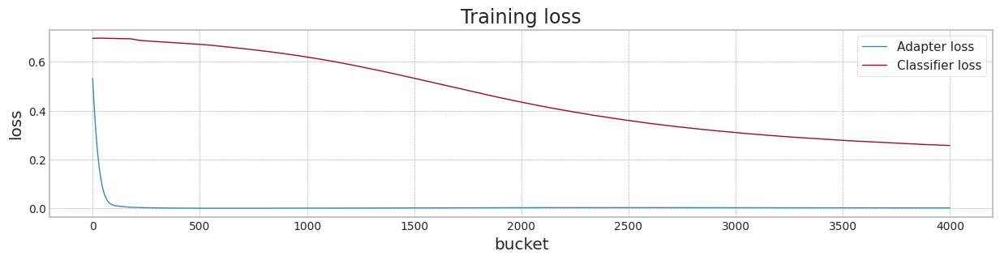

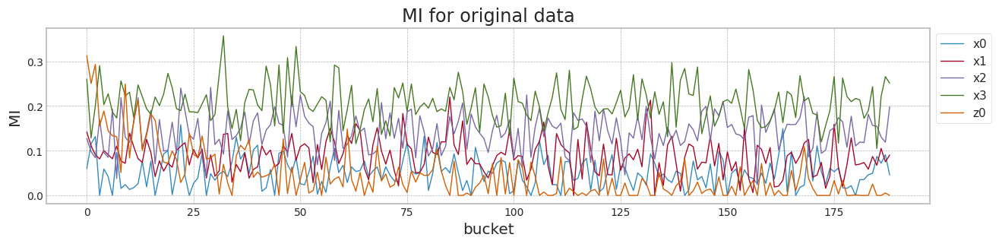

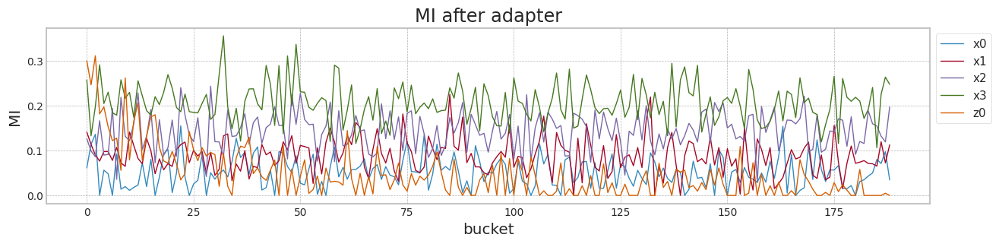

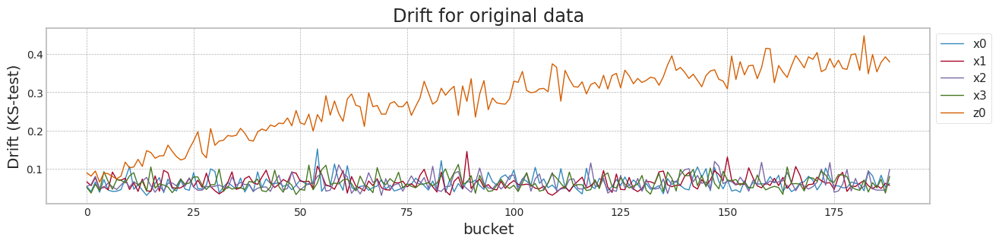

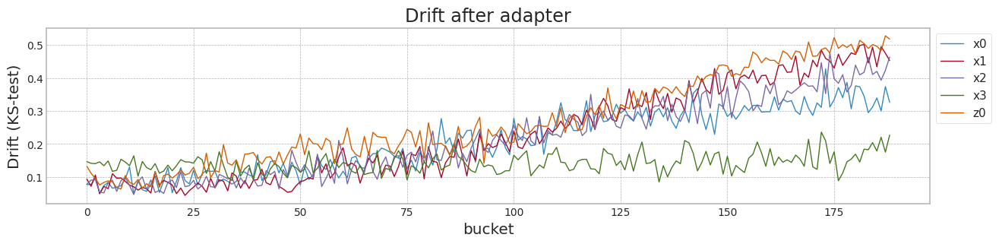

In [23]:
avaible_range = 400
seed = 1
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2
    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,X[0:1800][['x0','x1','x2','x3','z0']],X[2000:][['x0','x1','x2','x3','z0','b']],y[2000:])
        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()


## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

In [24]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [25]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [26]:
x1.shape

(40000, 5)

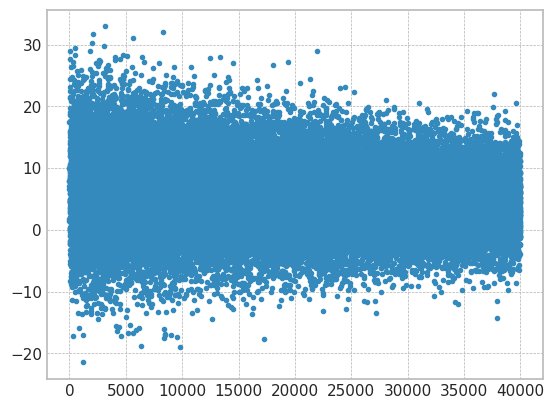

In [27]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

plt.plot(y1_array,'.')

In [28]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


In [29]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)
mi_scores = make_mi_scores(X1, y1, discrete_features="auto")
print(mi_scores)

x0    0.227465
z0    0.088169
x1    0.018550
x3    0.008429
x2    0.006772
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 66.39it/s]


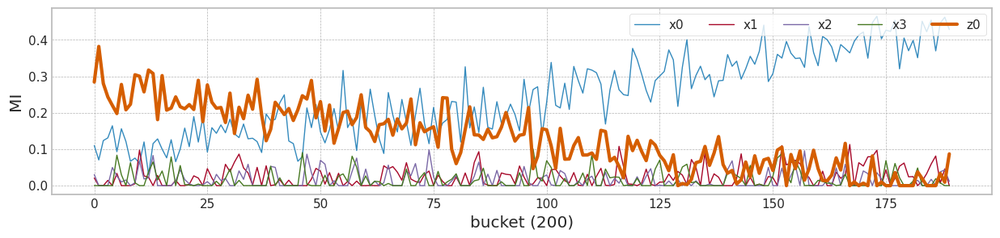

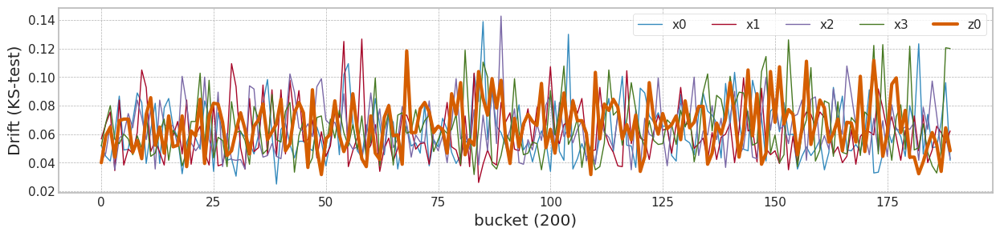

In [30]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c2 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X1 = pd.DataFrame(np.concatenate((scaler_c2.fit_transform(X1[0:1800]), scaler_c2.transform(X1[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X1[bk*bucket_size:bk*bucket_size+bucket_size], y1[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X1[0:1800].values,X1[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

cuda:0


100%|██████████| 1000/1000 [00:25<00:00, 39.40it/s]


MSE: 0.07
RMSE: 0.26


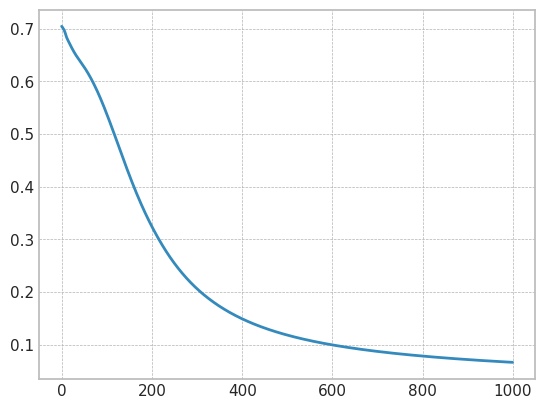

feature 5, test_f1 0.9867841409691629


In [31]:
import copy
import torch.optim as optim

seed_everything()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Convert to 2D PyTorch tensors
X_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_train = torch.tensor(y1[0:1800], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_test = torch.tensor(y1[1800:2000], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
).to(device)

# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)

n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())

# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 189/189 [00:00<00:00, 390.25it/s]


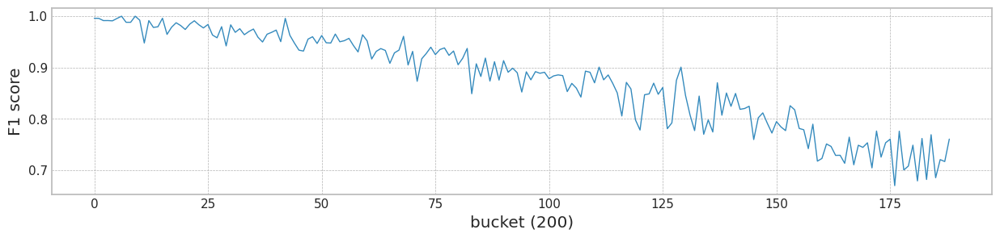

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Case #2 Feature 5,0.986784,0.996016,0.87628,0.760684,0.087066


In [32]:
XT = X1[2000:][['x0','x1','x2','x3','z0']]
yT = y1[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({bucket_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Case #2 Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

In [34]:
X1['b'] = [int(b/100) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.519751,0.468030,0.270011,0.516605,0.339159,0
1,0.605565,0.386136,0.467312,0.549700,0.666164,0
2,0.551222,0.433079,0.644682,0.704678,0.471856,0
3,0.335978,0.625620,0.283118,0.494381,0.609888,0
4,0.496805,0.524298,0.566753,0.426693,0.472373,0
...,...,...,...,...,...,...
39995,0.325122,0.364328,0.241452,0.576603,0.717378,399
39996,0.350268,0.453351,0.284085,0.543373,0.701927,399
39997,0.553850,0.305018,0.504892,0.544244,0.491374,399
39998,0.426469,0.502344,0.239389,0.229965,0.775500,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.707444]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.684251]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.660318]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.642272]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.626087]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.607096]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.584608]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.558883]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.530579]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.500473]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.469480]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.438538]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.408405]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 55.33it/s]


mean of drift:
x0    0.061681
x1    0.060982
x2    0.064253
x3    0.064427
z0    0.065844
dtype: float64
Mean F1 for all data: 0.8586993294097212
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 5.847818] [G loss: 0.662996]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 13.847788] [G loss: 0.548896]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 96.311005] [G loss: 0.256368]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 211.010330] [G loss: 0.133568]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 322.151672] [G loss: 0.090558]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 437.067383] [G loss: 0.068418]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 563.378113] [G loss: 0.054226]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 686.405029] [G loss: 0.044539]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 784.304199] [G loss: 0.037662]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 877.766724] [G loss: 0.032473]
[Lambda: 0.00

100%|██████████| 189/189 [00:03<00:00, 53.54it/s]


mean of drift:
x0    0.999656
x1    0.934286
x2    1.000000
x3    1.000000
z0    0.930165
dtype: float64
Mean F1 for all data: 0.8809434779632576
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.026875] [G loss: 0.686371]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.107973] [G loss: 0.618244]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.286674] [G loss: 0.527114]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.373119] [G loss: 0.453865]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.441449] [G loss: 0.383848]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.473383] [G loss: 0.324171]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.480264] [G loss: 0.274948]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.469750] [G loss: 0.235298]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.458195] [G loss: 0.201638]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.441340] [G loss: 0.174323]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.62it/s]


mean of drift:
x0    0.932643
x1    0.950985
x2    0.409224
x3    0.852081
z0    0.850467
dtype: float64
Mean F1 for all data: 0.21546745875119297
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.009660] [G loss: 0.690792]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.029045] [G loss: 0.644690]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.103233] [G loss: 0.566016]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.141839] [G loss: 0.497449]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.174501] [G loss: 0.429927]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.193065] [G loss: 0.369022]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.202478] [G loss: 0.316161]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.202565] [G loss: 0.272597]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.198467] [G loss: 0.237592]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.193186] [G loss: 0.208504]
[Lambda: 0.200000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 54.02it/s]


mean of drift:
x0    0.933801
x1    0.916093
x2    0.817237
x3    0.678827
z0    0.332084
dtype: float64
Mean F1 for all data: 0.18185368109603278
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.005142] [G loss: 0.692729]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.013224] [G loss: 0.650819]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.049195] [G loss: 0.585165]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.071732] [G loss: 0.522694]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.087630] [G loss: 0.461177]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.102853] [G loss: 0.398892]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.110368] [G loss: 0.343493]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.113487] [G loss: 0.296753]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.113306] [G loss: 0.258980]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.112457] [G loss: 0.227546]
[Lambda: 0.300000] [Epoch 22

100%|██████████| 189/189 [00:04<00:00, 45.21it/s]


mean of drift:
x0    0.960597
x1    0.758292
x2    0.844280
x3    0.398692
z0    0.529309
dtype: float64
Mean F1 for all data: 0.12111620096832831
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.003857] [G loss: 0.693674]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.006544] [G loss: 0.656287]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.025671] [G loss: 0.601021]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.040404] [G loss: 0.546392]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.046782] [G loss: 0.500738]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.054674] [G loss: 0.442797]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.063811] [G loss: 0.385427]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.069568] [G loss: 0.332493]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.071445] [G loss: 0.289142]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.071843] [G loss: 0.253720]
[Lambda: 0.400000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 52.79it/s]


mean of drift:
x0    0.945376
x1    0.647425
x2    0.388060
x3    0.255144
z0    0.642625
dtype: float64
Mean F1 for all data: 0.14309301910714195
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.003395] [G loss: 0.694251]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.003394] [G loss: 0.660305]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.013315] [G loss: 0.616781]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.024537] [G loss: 0.565149]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.029203] [G loss: 0.521377]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.032438] [G loss: 0.481907]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.035518] [G loss: 0.443114]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.038582] [G loss: 0.404020]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.040750] [G loss: 0.366198]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.042251] [G loss: 0.330969]
[Lambda: 0.500000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 54.36it/s]


mean of drift:
x0    0.948827
x1    0.617137
x2    0.241079
x3    0.082184
z0    0.558277
dtype: float64
Mean F1 for all data: 0.13299130650668367
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003222] [G loss: 0.694556]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.001866] [G loss: 0.663353]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.006475] [G loss: 0.628318]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.012858] [G loss: 0.588807]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.017624] [G loss: 0.545212]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.020447] [G loss: 0.506184]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.022788] [G loss: 0.468413]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.024775] [G loss: 0.430873]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.026425] [G loss: 0.393658]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.027579] [G loss: 0.358249]
[Lambda: 0.600000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 52.32it/s]


mean of drift:
x0    0.962040
x1    0.369603
x2    0.125879
x3    0.077740
z0    0.697055
dtype: float64
Mean F1 for all data: 0.09339822845552995
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003181] [G loss: 0.694775]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001117] [G loss: 0.665651]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.002872] [G loss: 0.637102]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.006201] [G loss: 0.605546]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.009257] [G loss: 0.569558]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.011454] [G loss: 0.528764]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.013058] [G loss: 0.490740]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.014389] [G loss: 0.453862]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.015619] [G loss: 0.417051]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.016529] [G loss: 0.381575]
[Lambda: 0.700000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 53.55it/s]


mean of drift:
x0    0.913201
x1    0.234189
x2    0.094456
x3    0.076887
z0    0.661041
dtype: float64
Mean F1 for all data: 0.17675971169093163
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.003184] [G loss: 0.694967]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000779] [G loss: 0.667489]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.001035] [G loss: 0.644341]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.002280] [G loss: 0.621148]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.003860] [G loss: 0.590920]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.005256] [G loss: 0.557249]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.006207] [G loss: 0.523282]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.007052] [G loss: 0.488322]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.007757] [G loss: 0.453163]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.008459] [G loss: 0.416370]
[Lambda: 0.800000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 54.86it/s]


mean of drift:
x0    0.903054
x1    0.109636
x2    0.078754
x3    0.080176
z0    0.439103
dtype: float64
Mean F1 for all data: 0.17739904107653176
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 0.514346] [G loss: 0.705029]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.003205] [G loss: 0.695101]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000658] [G loss: 0.669031]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000255] [G loss: 0.650269]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000490] [G loss: 0.634548]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000857] [G loss: 0.613723]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.001321] [G loss: 0.586430]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.001793] [G loss: 0.555073]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.002204] [G loss: 0.521855]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.002522] [G loss: 0.488228]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.002808] [G loss: 0.454412]
[Lambda: 0.900000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 53.61it/s]


mean of drift:
x0    0.353439
x1    0.086217
x2    0.079515
x3    0.079124
z0    0.396196
dtype: float64
Mean F1 for all data: 0.9032244470428321


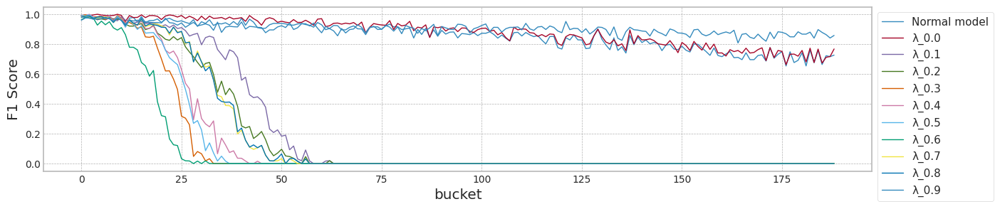

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #1, Normal model  0.961702  0.984127  0.858699  0.726496  0.327060
1                     0.0  0.991150  0.992000  0.880943  0.767773  0.313484
2                     0.1  0.982456  0.992000  0.215467  0.000000  0.303489
3                     0.2  0.982456  0.991935  0.181854  0.000000  0.303489
4                     0.3  0.973913  0.987952  0.121116  0.000000  0.311551
5                     0.4  0.978166  0.988048  0.143093  0.000000  0.297797
6                     0.5  0.978355  0.992000  0.132991  0.000000  0.330123
7                     0.6  0.969957  0.963265  0.093398  0.000000  0.343429
8                     0.7  0.957627  0.980080  0.176760  0.000000  0.330528
9                     0.8  0.961702  0.980080  0.177399  0.000000  0.331575
10                    0.9  0.961702  0.960630  0.903224  0.858333  0.331575
max_mean_lambda= 0.9


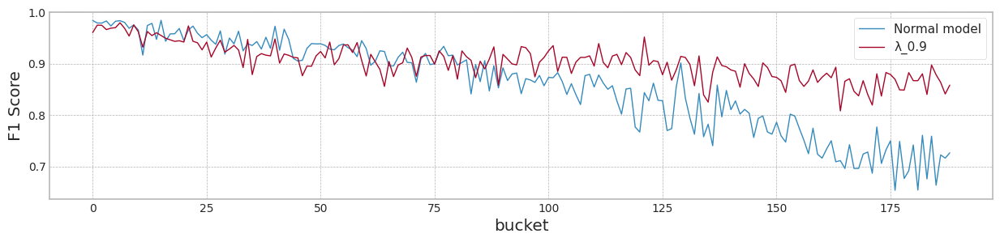

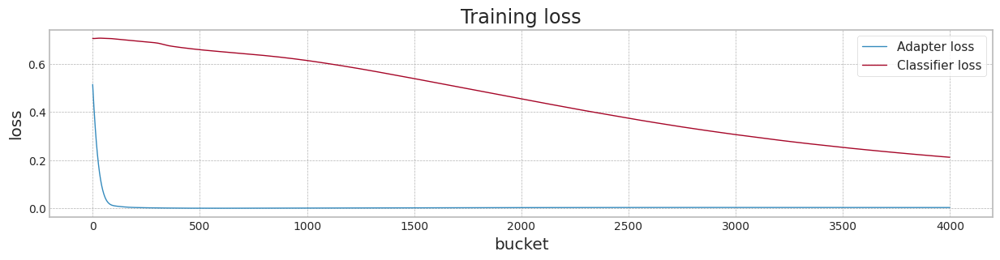

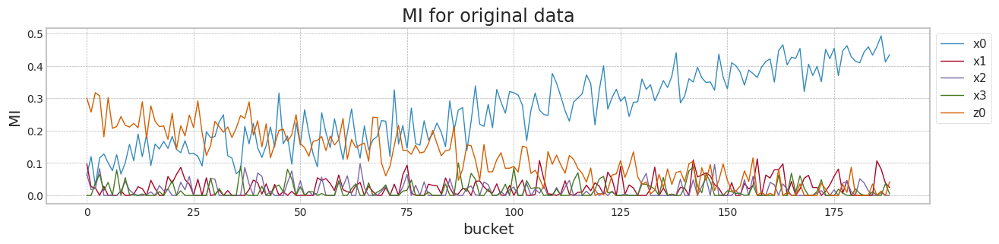

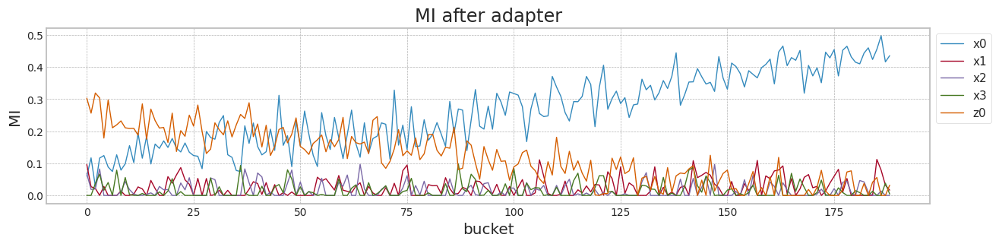

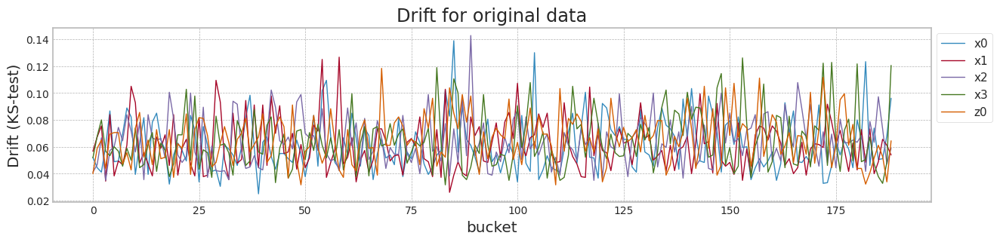

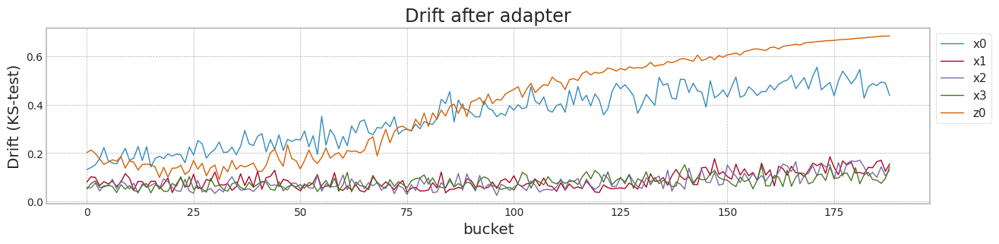

In [38]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y1[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X1[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y1[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X1[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y1[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X1[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y1[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X1[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,X1[0:1800][['x0','x1','x2','x3','z0']],X1[2000:][['x0','x1','x2','x3','z0','b']],y1[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### data 생성

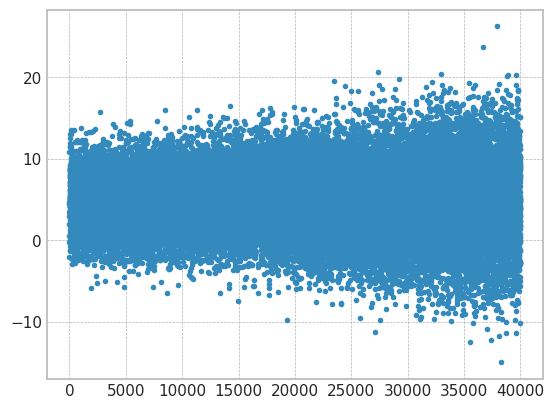

In [39]:
import matplotlib.pyplot as plt

seed_everything(2)

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

x2 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x2[:,ix] = np.random.normal(1,cor_,data_size)

y2_array = []
cor_const = 3/x2.shape[0]
for ii in range(x2.shape[0]):
    e = np.random.normal(0.0, 3*cor_const * ii)
    e1 = 0.0 #np.random.normal(0.0, cor_const * ii)
    x2[ii,4] = x2[ii,4] + e
    y2_array.append(np.sum(cor * x2[ii])+e1)

plt.plot(y2_array,'.')

In [40]:
m = 5 #np.mean(y2_array)
print(m)
y2 = [1 if y_ > m else 0 for y_ in y2_array]
sum(y2)

5


18973

In [41]:
columns=['x0','x1','x2','x3','z0']
X2 = pd.DataFrame(x2,columns=columns)
mi_scores = make_mi_scores(X2, y2, discrete_features="auto")
print(mi_scores)

z0    0.143465
x0    0.139701
x1    0.050595
x2    0.017249
x3    0.000037
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 200/200 [00:03<00:00, 66.25it/s]


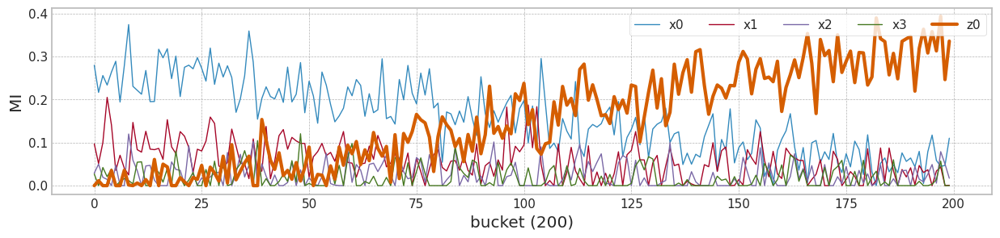

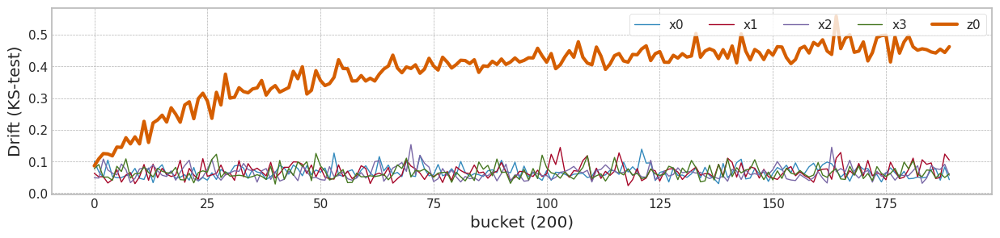

In [42]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c3 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X2 = pd.DataFrame(np.concatenate((scaler_c3.fit_transform(X2[0:1800]), scaler_c3.transform(X2[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((X2.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)
    for bk in tqdm(range(bucket_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X2[bk*bucket_size:bk*bucket_size+bucket_size], y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X2[0:1800].values,X2[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    '''
    df_mis['x0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x1'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x2'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x3'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['z0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

#### concept drift tolerant 학습

In [43]:
X2['b'] = [int(b/100) for b in X2.index.values]
X2

,x0,x1,x2,x3,z0,b
0,-0.388385,-2.251269,-0.673942,1.496245,-1.450203,0
1,-0.025065,0.330263,-0.203517,-0.192385,-0.784438,0
2,-2.121314,-0.426696,-0.814303,-1.114826,-1.333204,0
3,1.684784,1.138380,0.854071,-0.446355,0.756200,0
4,-1.775864,0.000987,-0.954858,0.149036,-1.188294,0
...,...,...,...,...,...,...
39995,-0.911572,0.613570,-0.753471,0.358113,6.019574,399
39996,-0.469348,1.145348,-0.422127,-0.976095,-9.484264,399
39997,-0.546602,0.140305,-2.237145,-0.398031,19.983367,399
39998,-0.406628,0.766944,2.127510,0.931603,-20.577919,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.696688]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.671295]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.619600]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.552930]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.480211]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.408787]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.344441]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.289852]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.245261]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.209118]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.179695]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.155740]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.136380]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 55.23it/s]


mean of drift:
x0    0.066817
x1    0.067307
x2    0.063521
x3    0.065220
z0    0.385173
dtype: float64
Mean F1 for all data: 0.9316475726662383
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 20.173222] [G loss: 0.428877]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 134.549759] [G loss: 0.153059]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 277.564514] [G loss: 0.081294]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 403.524719] [G loss: 0.053982]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 523.362244] [G loss: 0.039574]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 656.392456] [G loss: 0.030410]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 793.893127] [G loss: 0.024022]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 949.240906] [G loss: 0.019013]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 1120.406982] [G loss: 0.015082]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 1297.259888] [G loss: 0.012006]
[Lambda:

100%|██████████| 189/189 [00:03<00:00, 53.95it/s]


mean of drift:
x0    0.596132
x1    0.712061
x2    0.682566
x3    0.981899
z0    0.865476
dtype: float64
Mean F1 for all data: 0.92066311032611
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.078015] [G loss: 0.649929]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.248713] [G loss: 0.541309]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.384896] [G loss: 0.428525]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.441379] [G loss: 0.337347]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.439364] [G loss: 0.270631]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.407105] [G loss: 0.222860]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.370826] [G loss: 0.187469]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.333277] [G loss: 0.160780]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.297915] [G loss: 0.139857]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.267145] [G loss: 0.122818]
[Lambda: 0.100000] [Epoch 2200/

100%|██████████| 189/189 [00:03<00:00, 54.03it/s]


mean of drift:
x0    0.293219
x1    0.382002
x2    0.307734
x3    0.262075
z0    0.374606
dtype: float64
Mean F1 for all data: 0.8183428571998033
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.013583] [G loss: 0.661236]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.061976] [G loss: 0.574406]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.108399] [G loss: 0.474055]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.133630] [G loss: 0.383812]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.138945] [G loss: 0.311743]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.131921] [G loss: 0.257196]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.119576] [G loss: 0.216068]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.105522] [G loss: 0.184590]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.091966] [G loss: 0.159694]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.079542] [G loss: 0.139474]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.89it/s]


mean of drift:
x0    0.466093
x1    0.572340
x2    0.485376
x3    0.154386
z0    0.372352
dtype: float64
Mean F1 for all data: 0.6773135191185584
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.005439] [G loss: 0.664235]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.022036] [G loss: 0.589377]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.043127] [G loss: 0.497148]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.056308] [G loss: 0.408810]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.060245] [G loss: 0.334531]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.057571] [G loss: 0.276373]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.052115] [G loss: 0.231391]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.045805] [G loss: 0.196368]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.039787] [G loss: 0.168651]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.034669] [G loss: 0.146165]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.28it/s]


mean of drift:
x0    0.183789
x1    0.342884
x2    0.350529
x3    0.095241
z0    0.383533
dtype: float64
Mean F1 for all data: 0.75363039797411
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.003245] [G loss: 0.665585]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.009300] [G loss: 0.597377]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.019466] [G loss: 0.511368]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.026751] [G loss: 0.425348]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.029727] [G loss: 0.349976]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.028856] [G loss: 0.289362]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.026476] [G loss: 0.241764]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.023340] [G loss: 0.204573]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.020418] [G loss: 0.175112]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.017921] [G loss: 0.151311]
[Lambda: 0.400000] [Epoch 2200/

100%|██████████| 189/189 [00:04<00:00, 41.82it/s]


mean of drift:
x0    0.167210
x1    0.360338
x2    0.220514
x3    0.125535
z0    0.382119
dtype: float64
Mean F1 for all data: 0.798753352167879
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.002426] [G loss: 0.666359]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.004265] [G loss: 0.602255]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.009108] [G loss: 0.521054]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.013088] [G loss: 0.437477]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.015060] [G loss: 0.361953]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.015258] [G loss: 0.299334]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.014160] [G loss: 0.249827]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.012629] [G loss: 0.210917]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.011096] [G loss: 0.180176]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.009751] [G loss: 0.155479]
[Lambda: 0.500000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 55.25it/s]


mean of drift:
x0    0.122551
x1    0.235758
x2    0.217613
x3    0.073022
z0    0.382513
dtype: float64
Mean F1 for all data: 0.846956923957673
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.002079] [G loss: 0.666857]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.002095] [G loss: 0.605435]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.004177] [G loss: 0.528004]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.006291] [G loss: 0.446734]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.007443] [G loss: 0.371614]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.007744] [G loss: 0.308068]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.007432] [G loss: 0.256970]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.006758] [G loss: 0.216531]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.005994] [G loss: 0.184663]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.005302] [G loss: 0.159212]
[Lambda: 0.600000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 54.24it/s]


mean of drift:
x0    0.189309
x1    0.142937
x2    0.194700
x3    0.068774
z0    0.383116
dtype: float64
Mean F1 for all data: 0.8277440306106849
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.001921] [G loss: 0.667203]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001083] [G loss: 0.607676]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001843] [G loss: 0.533038]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.002745] [G loss: 0.454193]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.003403] [G loss: 0.379659]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.003678] [G loss: 0.315651]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.003571] [G loss: 0.263649]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.003326] [G loss: 0.222058]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.003020] [G loss: 0.189076]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.002642] [G loss: 0.162955]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.12it/s]


mean of drift:
x0    0.201952
x1    0.113527
x2    0.150514
x3    0.069982
z0    0.382678
dtype: float64
Mean F1 for all data: 0.8452702841727947
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.001852] [G loss: 0.667455]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000617] [G loss: 0.609349]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000745] [G loss: 0.536905]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.001026] [G loss: 0.460106]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.001274] [G loss: 0.386700]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.001393] [G loss: 0.322749]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.001410] [G loss: 0.269998]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.001335] [G loss: 0.227641]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.001232] [G loss: 0.193786]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.001098] [G loss: 0.166793]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.01it/s]


mean of drift:
x0    0.115888
x1    0.087822
x2    0.112269
x3    0.072625
z0    0.383636
dtype: float64
Mean F1 for all data: 0.9002959177531714
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.262009] [G loss: 0.690320]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.001825] [G loss: 0.667656]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000423] [G loss: 0.610667]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000273] [G loss: 0.540038]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000277] [G loss: 0.465031]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000310] [G loss: 0.392780]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000331] [G loss: 0.329129]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000338] [G loss: 0.276053]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000330] [G loss: 0.233057]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000306] [G loss: 0.198521]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000279] [G loss: 0.170764]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.24it/s]


mean of drift:
x0    0.088225
x1    0.074541
x2    0.080273
x3    0.073348
z0    0.384894
dtype: float64
Mean F1 for all data: 0.9145103534825366


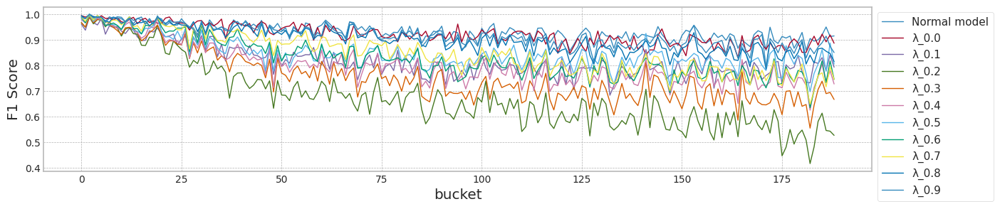

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #3, Normal model  0.994975  0.983784  0.931648  0.915254  0.000000
1                     0.0  0.990000  0.994652  0.920663  0.886700  0.006850
2                     0.1  0.980000  0.961326  0.818343  0.792899  0.011165
3                     0.2  0.984925  0.967033  0.677314  0.526316  0.000000
4                     0.3  0.990000  0.967391  0.753630  0.666667  0.006850
5                     0.4  0.990000  0.978261  0.798753  0.727273  0.006850
6                     0.5  0.990000  0.983784  0.846957  0.804878  0.006850
7                     0.6  0.990000  0.989247  0.827744  0.745098  0.006850
8                     0.7  0.990000  0.989247  0.845270  0.745098  0.006850
9                     0.8  0.990000  0.994652  0.900296  0.814815  0.006850
10                    0.9  0.990000  0.989247  0.914510  0.850299  0.006850
max_mean_lambda= 0.0


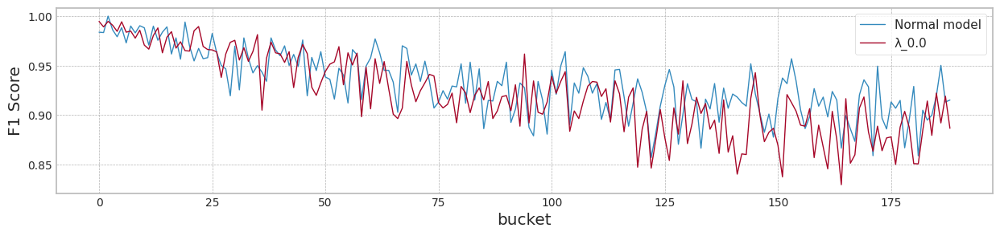

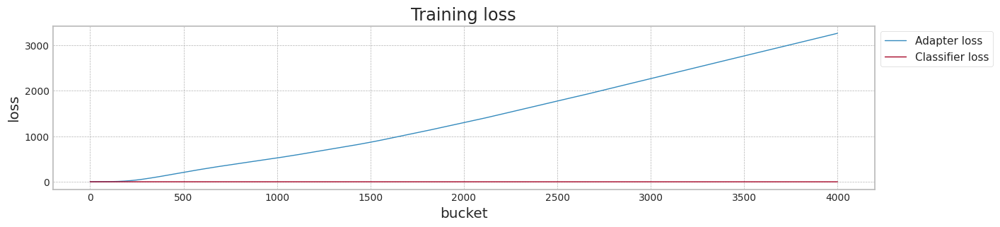

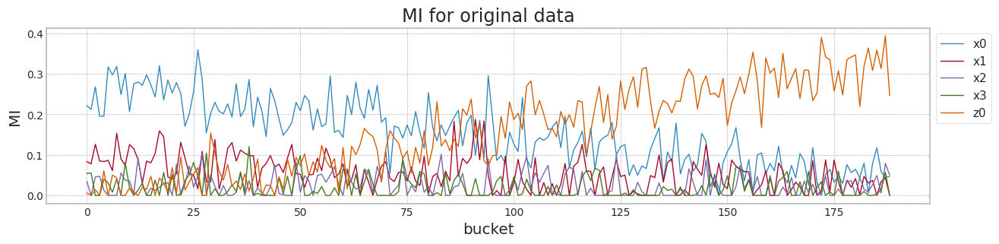

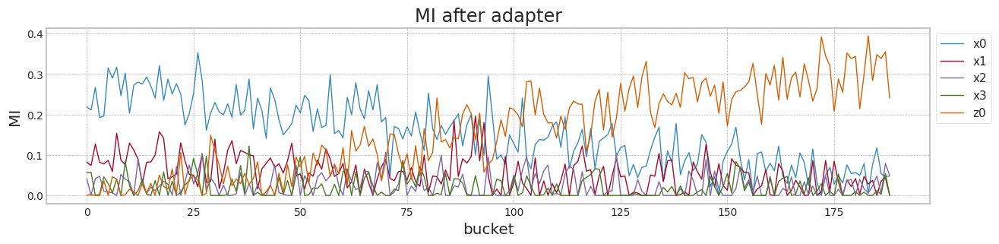

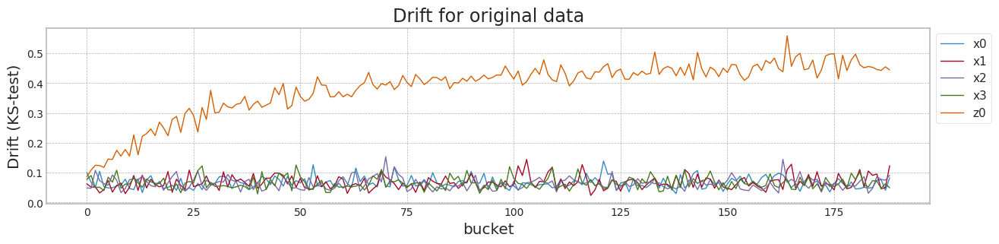

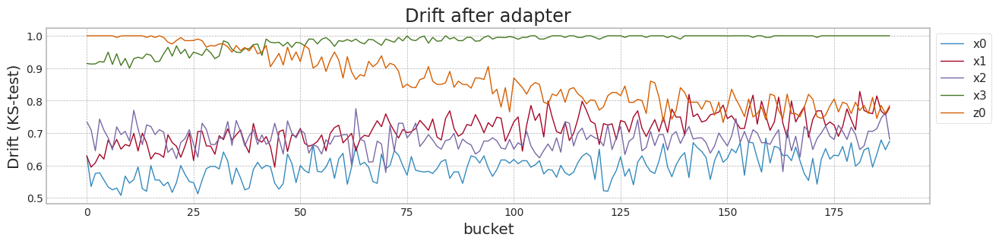

In [44]:

avaible_range = 400
'''
train_tensors = Namespace(XS_train = torch.tensor(X2[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y2[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X2[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X2[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y2[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X2[1800:2000][['z0']].values, dtype=torch.float32))
'''
train_tensors1 = Namespace(XS_train = torch.tensor(X2[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y2[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X2[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X2[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y2[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X2[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,X2[0:1800][['x0','x1','x2','x3','z0']],X2[2000:][['x0','x1','x2','x3','z0','b']],y2[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #3, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)


    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)


    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

### data 생성 (Test)

In [50]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


In [51]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)
mi_scores = make_mi_scores(X3, y3, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
z0    0.091439
x1    0.079411
x0    0.050887
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 65.87it/s]


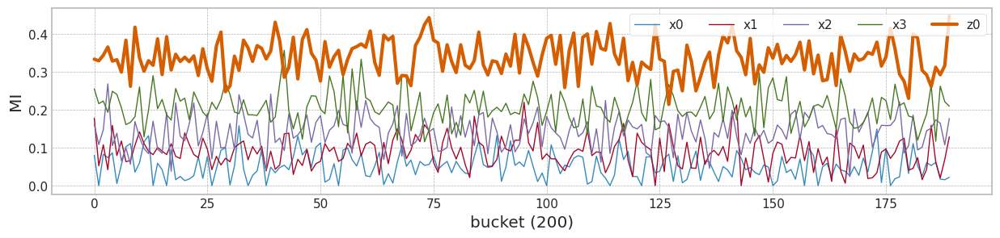

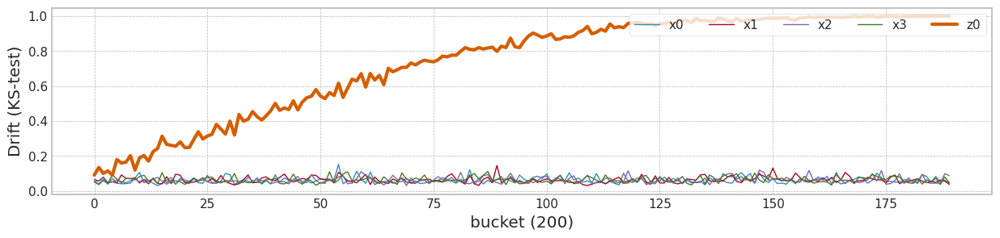

In [52]:
from tqdm import tqdm

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c4 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
scaler_c4.fit(X3[0:1800])
#X3 = pd.DataFrame(np.concatenate((scaler_c4.transform(X3[0:1800]), scaler_c4.transform(X3[1800:])),axis=0), columns=columns)
X3 = pd.DataFrame(scaler_c4.transform(X3), columns=columns)

for bucket_size in bucket_size_array:
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x3.shape[0]-2000)/bucket_size)

    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X3[bk*bucket_size:bk*bucket_size+bucket_size], y3[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X3[0:1800].values,X3[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 내성학습의 적용

In [53]:
X3['b'] = [int(b/100) for b in X3.index.values]
X3

,x0,x1,x2,x3,z0,b
0,0.470248,-0.657094,0.644936,-0.385024,0.289038,0
1,-0.098493,0.586148,0.837920,1.355031,1.004828,0
2,0.227515,1.703803,1.741631,0.321081,-0.583820,0
3,0.936628,-1.340995,-0.438504,-0.137903,-0.539317,0
4,0.861016,1.212753,0.120639,0.323837,1.138146,0
...,...,...,...,...,...,...
39995,-0.878001,-1.603546,0.040948,0.434072,3.908024,399
39996,-0.259746,-1.334902,-0.152821,0.351855,4.017011,399
39997,-0.661842,0.822949,0.806100,0.424942,6.259142,399
39998,0.080499,-1.616542,-1.980372,0.743351,5.036251,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.697719]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.662210]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.593723]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.502838]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.417379]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.346459]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.293216]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.255307]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.229146]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.211322]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.199097]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.190744]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.185021]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 57.34it/s]


mean of drift:
x0    0.061049
x1    0.062651
x2    0.061975
x3    0.063260
z0    0.734850
dtype: float64
Mean F1 for all data: 0.7391672404203216
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 16.048212] [G loss: 0.484207]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 80.250900] [G loss: 0.225084]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 127.921532] [G loss: 0.185552]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 151.736694] [G loss: 0.178741]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 164.605194] [G loss: 0.175439]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 169.304611] [G loss: 0.173816]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 172.579590] [G loss: 0.172768]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 175.855255] [G loss: 0.171960]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 179.580109] [G loss: 0.171198]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 183.509232] [G loss: 0.170472]
[Lambda: 0.

100%|██████████| 189/189 [00:03<00:00, 54.82it/s]


mean of drift:
x0    1.000000
x1    0.999903
x2    0.959250
x3    0.614318
z0    0.865353
dtype: float64
Mean F1 for all data: 0.7636979120725571
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.132567] [G loss: 0.625680]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.252186] [G loss: 0.513846]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.334368] [G loss: 0.392666]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.328539] [G loss: 0.311098]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.279231] [G loss: 0.261838]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.223798] [G loss: 0.231647]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.175677] [G loss: 0.212136]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.136759] [G loss: 0.199070]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.106202] [G loss: 0.189940]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.083958] [G loss: 0.183195]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.71it/s]


mean of drift:
x0    0.577807
x1    0.524565
x2    0.699109
x3    0.695567
z0    0.651805
dtype: float64
Mean F1 for all data: 0.7709530434825923
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.028359] [G loss: 0.644049]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.069411] [G loss: 0.543692]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.100012] [G loss: 0.429230]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.104862] [G loss: 0.342595]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.093067] [G loss: 0.284730]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.076201] [G loss: 0.247192]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.059818] [G loss: 0.222698]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.046865] [G loss: 0.206188]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.036413] [G loss: 0.194888]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.028472] [G loss: 0.186959]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.77it/s]


mean of drift:
x0    0.251055
x1    0.338592
x2    0.330514
x3    0.772939
z0    0.682634
dtype: float64
Mean F1 for all data: 0.7272506096919142
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.011571] [G loss: 0.650066]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.026594] [G loss: 0.558839]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.041138] [G loss: 0.449071]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.045679] [G loss: 0.360677]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.041415] [G loss: 0.298594]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.034709] [G loss: 0.256836]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.027889] [G loss: 0.229140]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.021777] [G loss: 0.210697]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.016976] [G loss: 0.198094]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.013076] [G loss: 0.189421]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 52.37it/s]


mean of drift:
x0    0.300000
x1    0.278060
x2    0.150076
x3    0.718157
z0    0.729218
dtype: float64
Mean F1 for all data: 0.7228749285092854
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.006461] [G loss: 0.653057]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.011674] [G loss: 0.567778]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.018829] [G loss: 0.461803]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.021825] [G loss: 0.373179]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.020658] [G loss: 0.308209]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.017466] [G loss: 0.263848]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.014006] [G loss: 0.234118]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.011004] [G loss: 0.214102]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.008480] [G loss: 0.200529]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.006462] [G loss: 0.191198]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 52.61it/s]


mean of drift:
x0    0.385035
x1    0.210035
x2    0.135982
x3    0.319633
z0    0.715829
dtype: float64
Mean F1 for all data: 0.7439570262516862
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.004425] [G loss: 0.654865]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.005613] [G loss: 0.573447]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.009070] [G loss: 0.470503]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.010689] [G loss: 0.382330]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.010463] [G loss: 0.315799]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.009011] [G loss: 0.269371]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.007216] [G loss: 0.238039]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.005658] [G loss: 0.216837]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.004358] [G loss: 0.202445]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.003369] [G loss: 0.192511]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.43it/s]


mean of drift:
x0    0.315902
x1    0.146961
x2    0.129906
x3    0.266611
z0    0.697063
dtype: float64
Mean F1 for all data: 0.7712105214865683
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003508] [G loss: 0.656062]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.002795] [G loss: 0.577391]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.004262] [G loss: 0.476973]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.005180] [G loss: 0.389204]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.005107] [G loss: 0.321886]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.004488] [G loss: 0.273977]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.003682] [G loss: 0.241204]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.002861] [G loss: 0.219100]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.002210] [G loss: 0.204006]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.001687] [G loss: 0.193672]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.02it/s]


mean of drift:
x0    0.166943
x1    0.102090
x2    0.099092
x3    0.197102
z0    0.692269
dtype: float64
Mean F1 for all data: 0.7638763278002734
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003058] [G loss: 0.656918]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001444] [G loss: 0.580227]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001903] [G loss: 0.481776]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.002314] [G loss: 0.394716]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.002297] [G loss: 0.326822]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.002029] [G loss: 0.277933]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.001680] [G loss: 0.244126]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.001325] [G loss: 0.221097]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.001039] [G loss: 0.205389]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.000799] [G loss: 0.194665]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.23it/s]


mean of drift:
x0    0.152122
x1    0.084835
x2    0.086229
x3    0.167328
z0    0.687316
dtype: float64
Mean F1 for all data: 0.7651805962170967
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.002835] [G loss: 0.657553]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000799] [G loss: 0.582417]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000778] [G loss: 0.485498]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000881] [G loss: 0.399197]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000869] [G loss: 0.330933]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000773] [G loss: 0.281216]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000635] [G loss: 0.246605]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000508] [G loss: 0.222901]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000399] [G loss: 0.206732]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000313] [G loss: 0.195641]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.48it/s]


mean of drift:
x0    0.127263
x1    0.076984
x2    0.073477
x3    0.132478
z0    0.696952
dtype: float64
Mean F1 for all data: 0.7575059054996508
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.263090] [G loss: 0.695157]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.002729] [G loss: 0.658043]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000522] [G loss: 0.584116]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000292] [G loss: 0.488507]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000248] [G loss: 0.402915]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000225] [G loss: 0.334431]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000193] [G loss: 0.284141]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000158] [G loss: 0.248829]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000126] [G loss: 0.224600]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000102] [G loss: 0.207999]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000081] [G loss: 0.196632]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.91it/s]


mean of drift:
x0    0.081158
x1    0.070638
x2    0.068874
x3    0.095394
z0    0.712925
dtype: float64
Mean F1 for all data: 0.7494148853693094


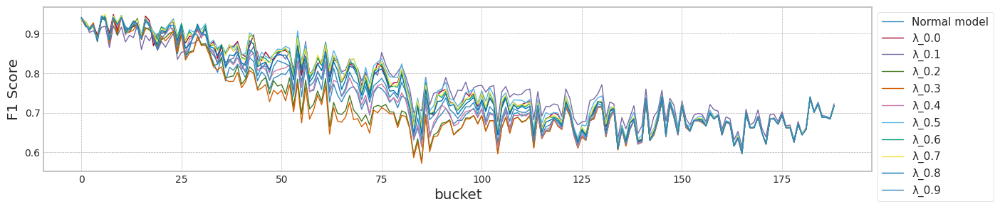

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #4, Normal model  0.895028  0.940639  0.739167  0.717949  0.430042
1                     0.0  0.900000  0.935780  0.763698  0.717949  0.427969
2                     0.1  0.898876  0.940092  0.770953  0.722581  0.431465
3                     0.2  0.910112  0.935780  0.727251  0.717949  0.450809
4                     0.3  0.910112  0.935780  0.722875  0.717949  0.442238
5                     0.4  0.905028  0.935780  0.743957  0.717949  0.425236
6                     0.5  0.905028  0.935780  0.771211  0.717949  0.425236
7                     0.6  0.910112  0.935780  0.763876  0.717949  0.440471
8                     0.7  0.905028  0.935780  0.765181  0.717949  0.425236
9                     0.8  0.900000  0.940639  0.757506  0.717949  0.413304
10                    0.9  0.895028  0.940639  0.749415  0.717949  0.430042
max_mean_lambda= 0.5


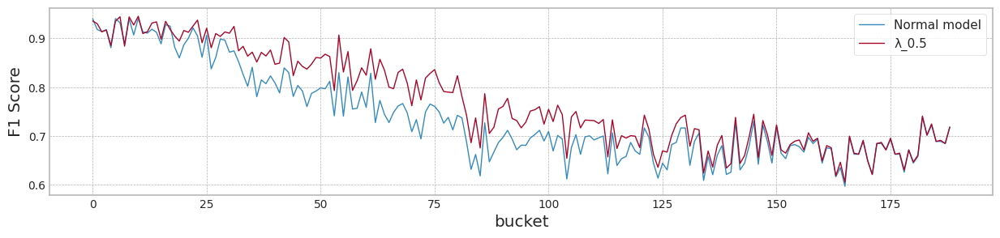

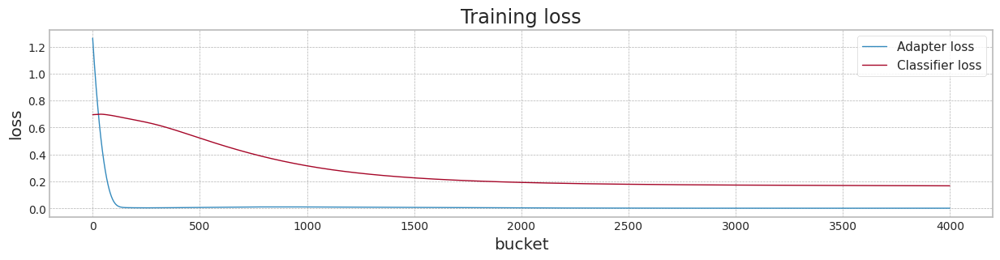

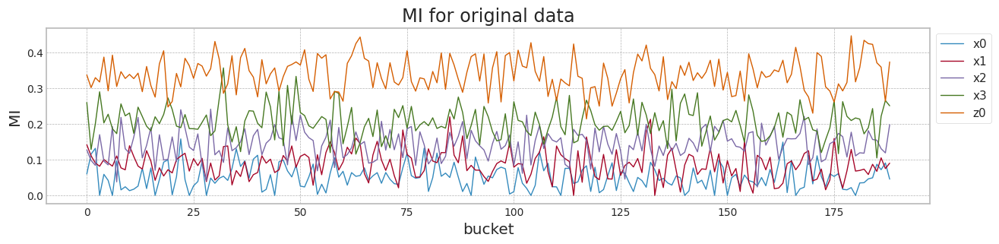

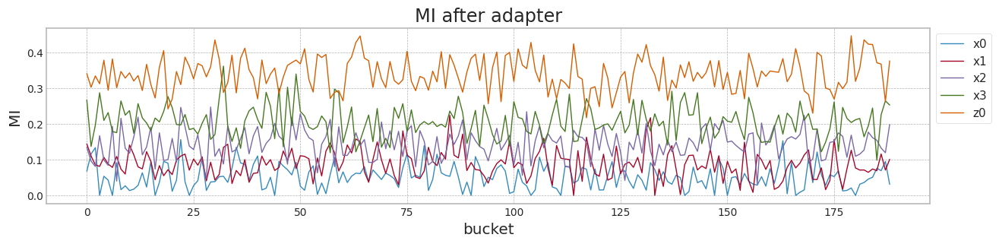

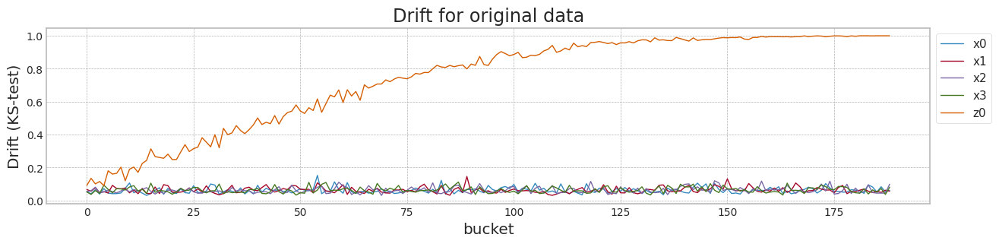

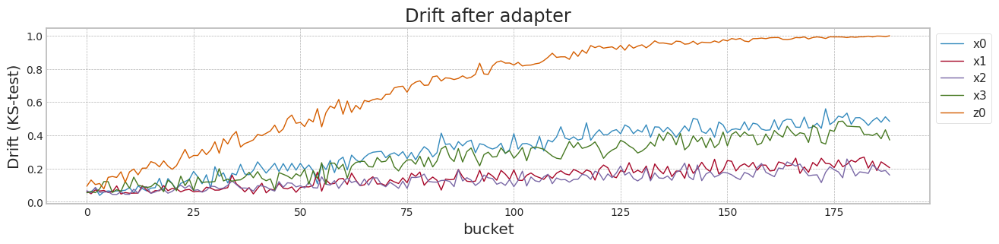

In [54]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X3[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                          y_train = torch.tensor(y3[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X3[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X3[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32),
                         y_test = torch.tensor(y3[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X3[1800:2000][['z0']].values, dtype=torch.float32))

train_tensors1 = Namespace(XS_train = torch.tensor(X3[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y3[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X3[0:1800][['z0']].values, dtype=torch.float32))
test_tensors1 = Namespace(XS_test = torch.tensor(X3[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y3[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X3[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors1, test_tensors1, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,X3[0:1800][['x0','x1','x2','x3','z0']],X3[2000:][['x0','x1','x2','x3','z0','b']],y3[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #4, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

In [55]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


In [56]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)
mi_scores = make_mi_scores(X4, y4, discrete_features="auto")
print(mi_scores)

x3    0.145527
x2    0.113997
z0    0.092832
x0    0.043090
x1    0.024980
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 65.66it/s]


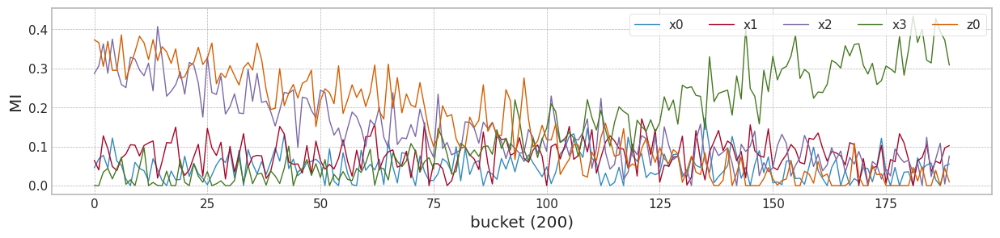

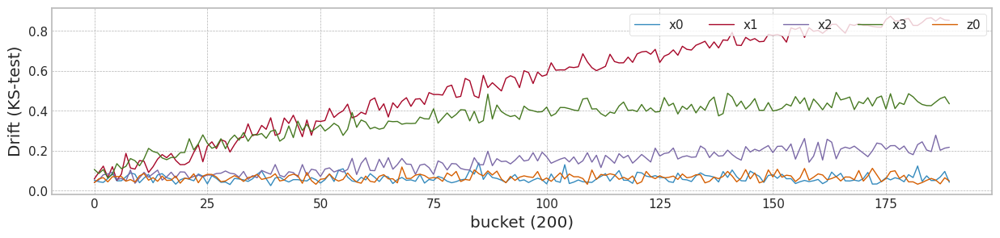

In [57]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c5 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
scaler_c5.fit(X4[0:1800])
X4 = pd.DataFrame(scaler_c5.transform(X4), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x4.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)
    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X4[bk*bucket_size:bk*bucket_size+bucket_size], y4[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X4[0:1800].values,X4[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3','z0']].values,linewidth=1,label=['x0','x1','x2','x3','z0'])
    #plt.plot(df_mis[['x2','x3','z0']].values,linewidth=3,label=['x2','x3','z0'])
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3','z0']].values,linewidth=1,label=['x0','x1','x2','x3','z0'])
    #plt.plot(df_drf[['x2','x3','z0']].values,linewidth=3,label=['x2','x3','z0'])
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

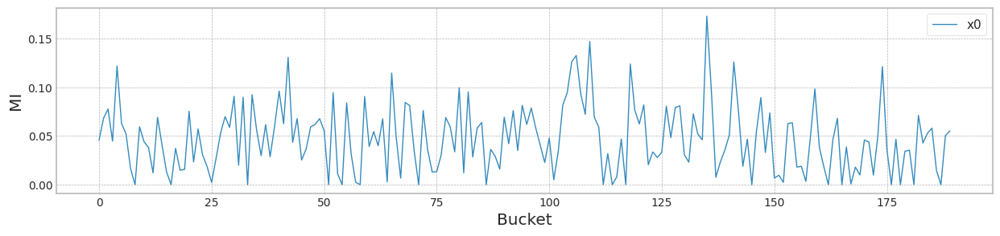

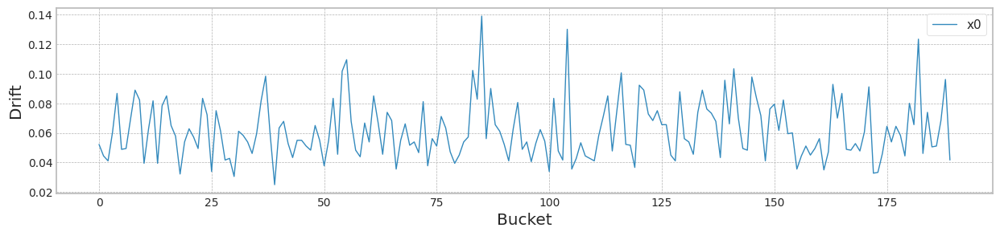

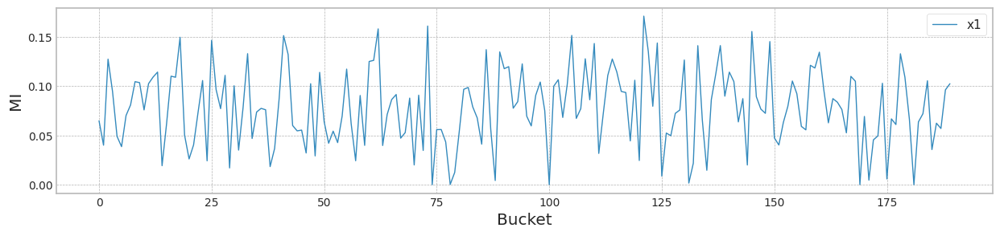

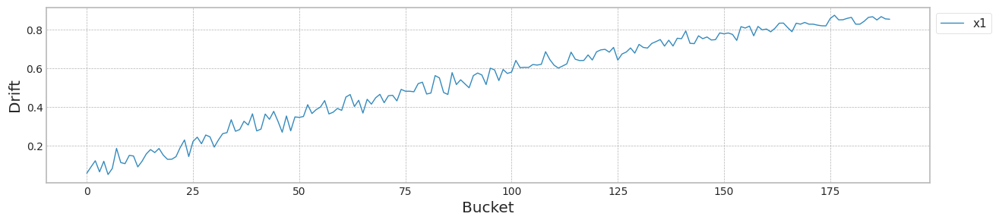

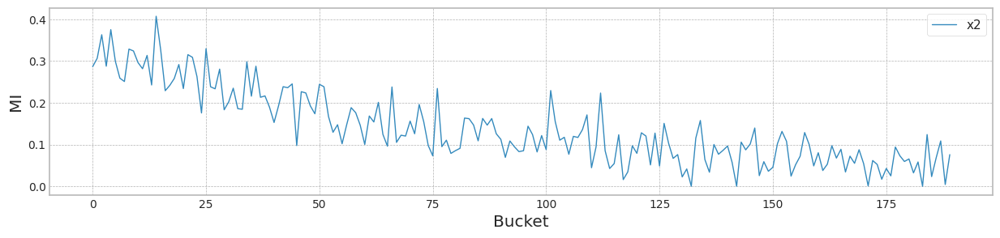

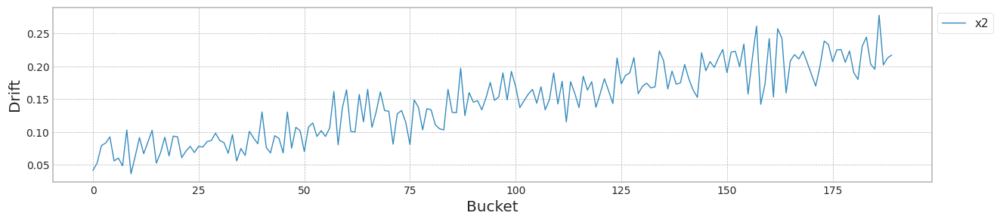

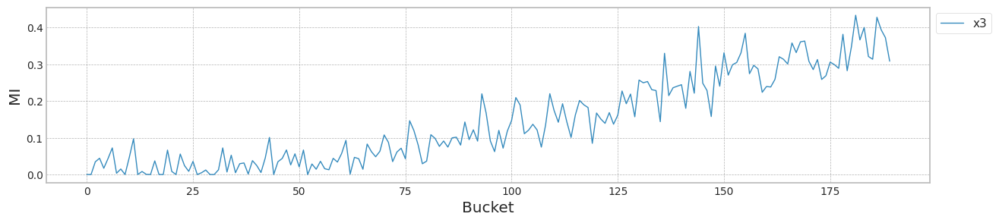

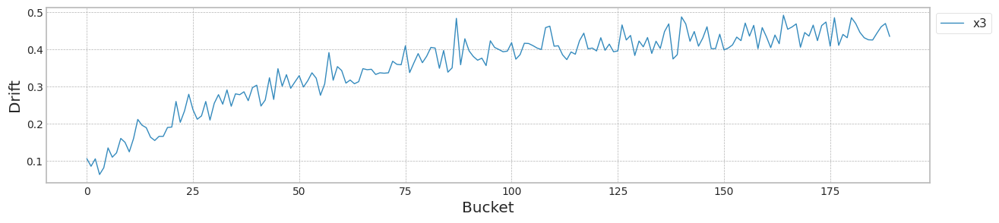

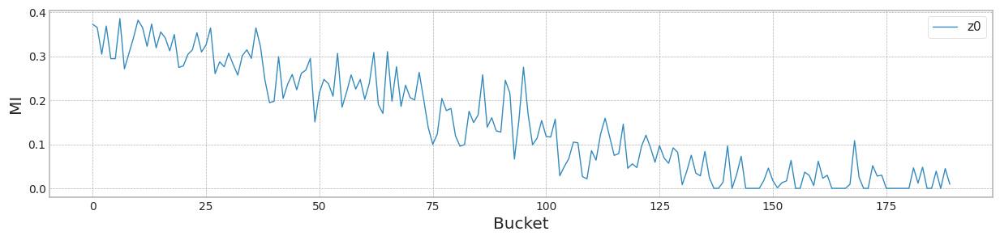

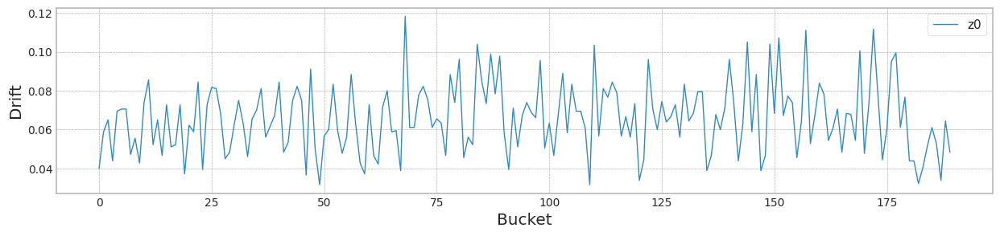

In [58]:
for cn in columns:
    df_mis[cn].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()
    df_drf[cn].plot(figsize=main_figsize,linewidth=1,ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

<table>
<tr>
<td>구분</td><td>x0</td><td>x1</td><td>x2</td><td>x3</td><td>z0</td>
</tr>
<tr>
<td>MI 증가</td><td>-</td><td>-</td><td>-</td><td>O</td><td>-</td>
</tr>
<tr>
<td>MI 감소</td><td>-</td><td>-</td><td>O</td><td>-</td><td>O</td>
</tr>
<tr>
<td>MI 고정</td><td>O</td><td>O</td><td>-</td><td>-</td><td>-</td>
</tr>

<tr>
<td>Drift 증가</td><td>-</td><td>O</td><td>O</td><td>O</td><td>-</td>
</tr>
<tr>
<td>Drift 감소</td><td>-</td><td>-</td><td>-</td><td>-</td><td>-</td>
</tr>
<tr>
<td>Drift 고정</td><td>O</td><td>-</td><td>-</td><td>-</td><td>O</td>
</tr>
</table>

### 내성학습의 적용!

In [59]:
X4['b'] = [int(b/100) for b in X4.index.values]
X4

,x0,x1,x2,x3,z0,b
0,0.557441,-0.817302,-1.425469,0.192742,-1.223276,0
1,1.187568,0.361915,-0.848668,0.402593,0.961059,0
2,0.788527,-0.740149,0.439556,1.384411,-0.336884,0
3,-0.791986,0.181836,1.717422,0.051917,0.585143,0
4,0.388948,0.638406,-1.440773,-0.378224,-0.333425,0
...,...,...,...,...,...,...
39995,-0.871702,1.547741,-2.000360,2.393277,1.303158,399
39996,-0.687055,4.730407,-1.954463,-3.314622,1.199950,399
39997,0.807827,4.017663,1.021360,15.497050,-0.206506,399
39998,-0.127522,4.603937,-0.581545,5.237343,1.691405,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.702924]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.667881]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.614163]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.542907]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.468669]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.399116]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.339553]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.291403]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.251569]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.214823]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.190997]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.174331]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.162350]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 56.38it/s]


mean of drift:
x0    0.061681
x1    0.532260
x2    0.145024
x3    0.354133
z0    0.065844
dtype: float64
Mean F1 for all data: 0.8300843520774839
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 18.499601] [G loss: 0.480700]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 102.038193] [G loss: 0.173031]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 169.525009] [G loss: 0.132339]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 205.820251] [G loss: 0.125431]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 225.355331] [G loss: 0.122141]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 234.773331] [G loss: 0.119513]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 239.720886] [G loss: 0.117727]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 241.842941] [G loss: 0.116309]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 244.657227] [G loss: 0.115262]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 248.398773] [G loss: 0.114293]
[Lambda: 0

100%|██████████| 189/189 [00:03<00:00, 54.31it/s]


mean of drift:
x0    0.698698
x1    1.000000
x2    0.602246
x3    0.897093
z0    0.841229
dtype: float64
Mean F1 for all data: 0.5532498115787043
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.224660] [G loss: 0.608193]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.389382] [G loss: 0.495220]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.432208] [G loss: 0.400357]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.421778] [G loss: 0.320616]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.383122] [G loss: 0.253489]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.322499] [G loss: 0.214825]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.264508] [G loss: 0.189719]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.216612] [G loss: 0.172057]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.178075] [G loss: 0.159082]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.146680] [G loss: 0.149281]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.57it/s]


mean of drift:
x0    0.781969
x1    0.288319
x2    0.819653
x3    0.381246
z0    0.304791
dtype: float64
Mean F1 for all data: 0.7587927371586207
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.046881] [G loss: 0.638217]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.104211] [G loss: 0.541871]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.136535] [G loss: 0.444381]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.141056] [G loss: 0.362673]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.135586] [G loss: 0.286601]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.116078] [G loss: 0.238026]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.096697] [G loss: 0.205902]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.079370] [G loss: 0.183750]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.065618] [G loss: 0.167658]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.054206] [G loss: 0.155628]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.34it/s]


mean of drift:
x0    0.594486
x1    0.573798
x2    0.777243
x3    0.377822
z0    0.542334
dtype: float64
Mean F1 for all data: 0.7591437550284006
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.017455] [G loss: 0.648362]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.038880] [G loss: 0.564063]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.056752] [G loss: 0.470020]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.062802] [G loss: 0.387020]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.062588] [G loss: 0.307895]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.055698] [G loss: 0.252770]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.046718] [G loss: 0.216427]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.038566] [G loss: 0.191390]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.031619] [G loss: 0.173414]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.026380] [G loss: 0.160010]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.96it/s]


mean of drift:
x0    0.447754
x1    0.592666
x2    0.683909
x3    0.371405
z0    0.621975
dtype: float64
Mean F1 for all data: 0.8033945890813595
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.008752] [G loss: 0.653293]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.016630] [G loss: 0.576742]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.025984] [G loss: 0.486875]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.030558] [G loss: 0.404024]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.031244] [G loss: 0.325465]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.028936] [G loss: 0.265044]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.024703] [G loss: 0.225182]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.020712] [G loss: 0.197589]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.017094] [G loss: 0.177989]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.014224] [G loss: 0.163606]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.44it/s]


mean of drift:
x0    0.354774
x1    0.540244
x2    0.574565
x3    0.366684
z0    0.447366
dtype: float64
Mean F1 for all data: 0.7433292677896153
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.005436] [G loss: 0.656170]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.007741] [G loss: 0.584590]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.012294] [G loss: 0.498632]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.015035] [G loss: 0.416699]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.015783] [G loss: 0.338094]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.015043] [G loss: 0.274896]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.013205] [G loss: 0.232361]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.011134] [G loss: 0.203009]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.009253] [G loss: 0.182072]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.007648] [G loss: 0.166879]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.40it/s]


mean of drift:
x0    0.311470
x1    0.508081
x2    0.406085
x3    0.366678
z0    0.289174
dtype: float64
Mean F1 for all data: 0.8519053088187503
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.003957] [G loss: 0.658029]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.003675] [G loss: 0.589956]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.005709] [G loss: 0.507191]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.007176] [G loss: 0.426494]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.007807] [G loss: 0.347963]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.007564] [G loss: 0.283135]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.006751] [G loss: 0.238774]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.005731] [G loss: 0.207890]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.004821] [G loss: 0.185819]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.003997] [G loss: 0.169841]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 52.52it/s]


mean of drift:
x0    0.267910
x1    0.487537
x2    0.378072
x3    0.364580
z0    0.359074
dtype: float64
Mean F1 for all data: 0.8157435400622275
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.003252] [G loss: 0.659332]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001783] [G loss: 0.593743]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.002507] [G loss: 0.513574]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.003182] [G loss: 0.434207]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.003494] [G loss: 0.356693]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.003472] [G loss: 0.290211]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.003129] [G loss: 0.244352]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.002700] [G loss: 0.212154]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.002242] [G loss: 0.189101]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.001859] [G loss: 0.172366]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.89it/s]


mean of drift:
x0    0.247366
x1    0.477490
x2    0.350755
x3    0.361182
z0    0.327143
dtype: float64
Mean F1 for all data: 0.8170425673488798
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.002906] [G loss: 0.660312]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000901] [G loss: 0.596576]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000982] [G loss: 0.518466]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.001181] [G loss: 0.440430]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.001297] [G loss: 0.362587]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.001305] [G loss: 0.295866]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.001189] [G loss: 0.249118]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.001027] [G loss: 0.216077]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000879] [G loss: 0.192266]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000732] [G loss: 0.174929]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.63it/s]


mean of drift:
x0    0.191984
x1    0.479812
x2    0.289106
x3    0.359518
z0    0.277563
dtype: float64
Mean F1 for all data: 0.8477562462249558
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.264988] [G loss: 0.706720]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.002746] [G loss: 0.661072]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000528] [G loss: 0.598787]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000334] [G loss: 0.522374]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000310] [G loss: 0.445534]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000312] [G loss: 0.368061]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000307] [G loss: 0.301069]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000276] [G loss: 0.253595]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000238] [G loss: 0.219732]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000204] [G loss: 0.195273]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000176] [G loss: 0.177483]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 53.61it/s]


mean of drift:
x0    0.117219
x1    0.499086
x2    0.213330
x3    0.358069
z0    0.182978
dtype: float64
Mean F1 for all data: 0.8584691748769498


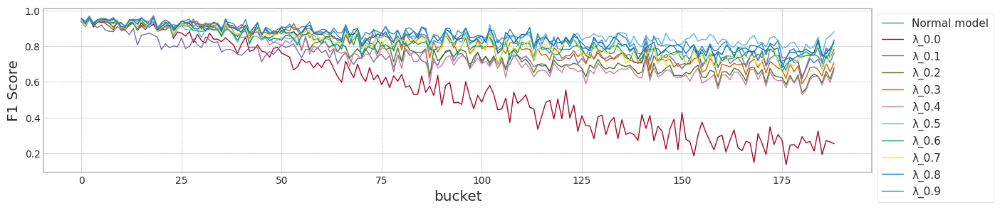

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #5, Normal model  0.957627  0.955752  0.830084  0.762646  0.376756
1                     0.0  0.957627  0.945946  0.553250  0.252101  0.385029
2                     0.1  0.953191  0.937500  0.758793  0.782258  0.379292
3                     0.2  0.953191  0.941704  0.759144  0.680272  0.369157
4                     0.3  0.953191  0.950673  0.803395  0.709220  0.369157
5                     0.4  0.957265  0.941704  0.743329  0.666667  0.373968
6                     0.5  0.961702  0.942222  0.851905  0.881517  0.389943
7                     0.6  0.961702  0.951111  0.815744  0.835165  0.389943
8                     0.7  0.961702  0.951111  0.817043  0.806630  0.389943
9                     0.8  0.961702  0.955752  0.847756  0.818182  0.389943
10                    0.9  0.957627  0.955752  0.858469  0.834081  0.376756
max_mean_lambda= 0.9


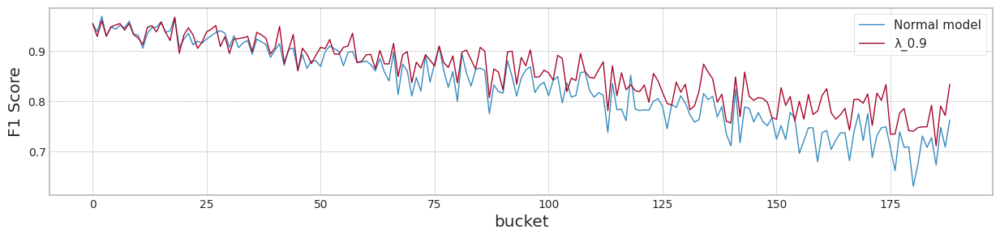

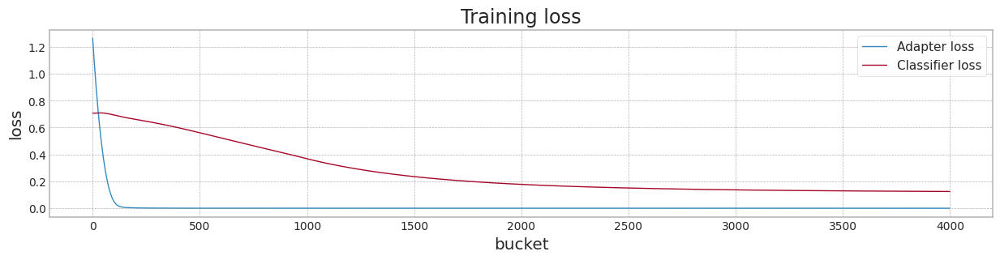

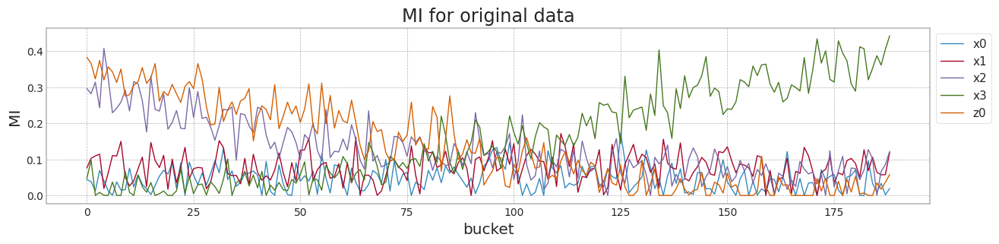

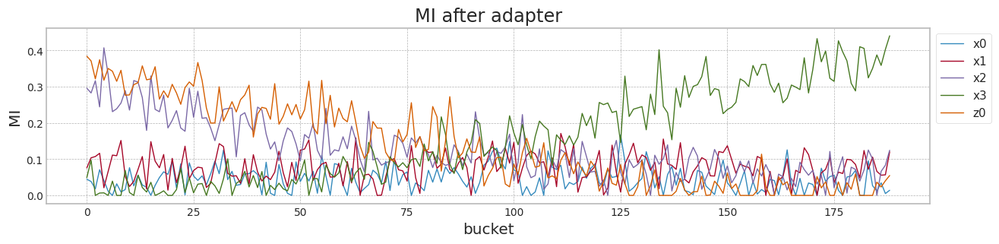

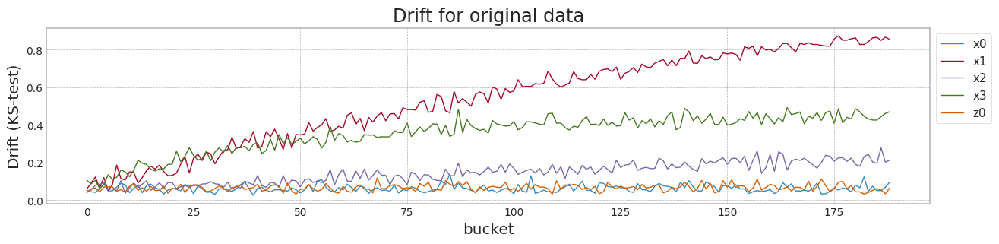

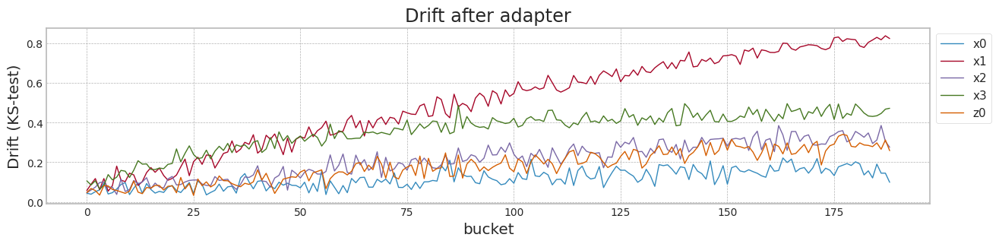

In [60]:
#train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X4[0:1800][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                          y_train = torch.tensor(y4[0:1800], dtype=torch.float32),
                          s1_train = torch.tensor(X4[0:1800][['z0']].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X4[1800:2000][['x0','x1','x2','x3','z0','b']].values, dtype=torch.float32),
                         y_test = torch.tensor(y4[1800:2000], dtype=torch.float32),
                         s1_test = torch.tensor(X4[1800:2000][['z0']].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,
                                           X4[0:1800][['x0','x1','x2','x3','z0']],
                                           X4[2000:][['x0','x1','x2','x3','z0','b']],
                                           y4[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #5, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()


## real-world data(Loan data)의 실험

In [61]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


### Data load

In [63]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


### Data 정제

In [64]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [65]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

### Dataset 만들기

In [66]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [67]:

X[2010].shape

(11497, 81)

In [68]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

### Data의 MI, Drift 특성 파악
+ MI Top 5에 대하여 MI의 변화
+ MI Top 5에 대하여 Drift의 변화

In [87]:
X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries              0.375201
last_fico_range_high    0.093714
last_pymnt_amnt         0.085805
total_rec_late_fee      0.034681
int_rate                0.018859
                          ...   
F5                      0.000000
D5                      0.000000
pub_rec                 0.000000
open_acc                0.000000
F3                      0.000000
Name: MI Scores, Length: 81, dtype: float64


In [88]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

+ 일부러 예측 확률을 떨어뜨리기 위해 (조정), "recoveries" feature를 제외 한다.

In [89]:
top_columns = list(mi_scores[2:7].index)
top_columns

['last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'fico_range_high',
 'term']

In [90]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[16, 14, 2, 6, 1]

In [91]:
# 2010년의 data를 기준으로 그 이후의 data 들...
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]
#X2_df_t5 = X2_df[top_columns]

Bucket size 10000 step_size 126


100%|██████████| 126/126 [00:26<00:00,  4.82it/s]


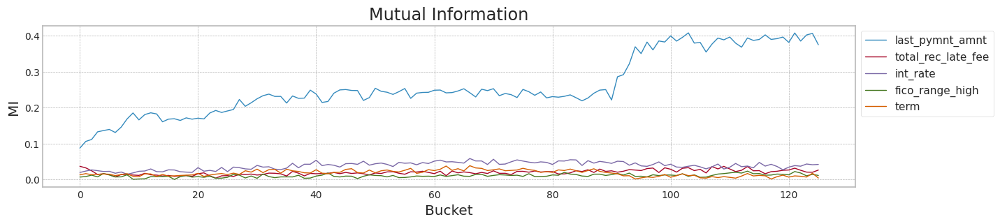

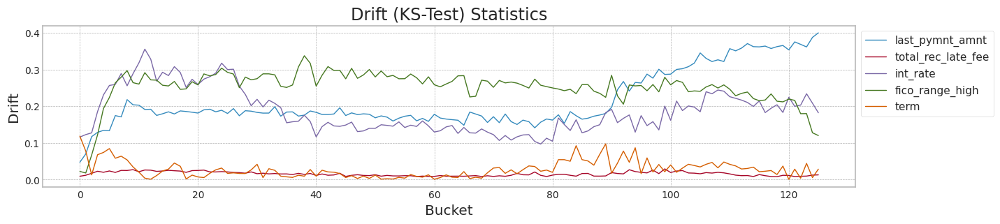

In [92]:
from tqdm import tqdm

bucket_size_array=[10000]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c1 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
scaler_c1.fit(X2[0:10000])  #11497
X2 = pd.DataFrame(scaler_c1.transform(X2[top_columns]), columns=top_columns)

for bucket_size in bucket_size_array:

    MIS = {}
    DRF = {}
    for col in top_columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((X2.shape[0]-10000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        '''
        mi_scores = make_mi_scores(X2_df_t5[bk*bucket_size:bk*bucket_size+bucket_size],
                                   Y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X_df[top_columns].values,X2_df_t5[bk*bucket_size+tl:bk*bucket_size+bucket_size+tl].values)
        '''
        mi_scores = make_mi_scores(X2[bk*bucket_size:bk*bucket_size+bucket_size], Y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X2[0:10000].values,X2[bk*bucket_size+10000:bk*bucket_size+bucket_size+10000].values)
        for ix,col in enumerate(top_columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    df_mis.plot(figsize=main_figsize,linewidth=1,title='Mutual Information',ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    df_drf.plot(figsize=main_figsize,linewidth=1,title='Drift (KS-Test) Statistics',ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

### Loan data의 학습

cuda:0


100%|██████████| 100/100 [00:01<00:00, 52.71it/s]


F1: 0.93


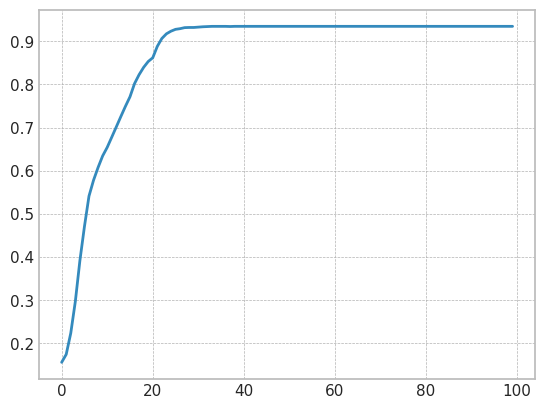

feature 5, test_f1 0.9345195729537367


In [93]:
import copy
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

seed_everything()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

X_train = torch.tensor(X2[0:10000].values, dtype=torch.float32).to(device)
y_train = torch.tensor(Y2[0:10000], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X2[10000:11497].values, dtype=torch.float32).to(device)
y_test = torch.tensor(Y2[10000:11497], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
loan_model = Generator().to(device)


# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(loan_model.parameters(), lr=0.0001)

n_epochs = 100   # number of epochs to run
batch_size = 1000  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = -np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    loan_model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = loan_model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    loan_model.eval()
    y_pred = loan_model(X_test)
    y_pred = (y_pred.cpu().data.numpy()> 0.5).astype(float)
    f1 = f1_score(y_pred, y_test.cpu().data.numpy())
    f1 = float(f1)
    history.append(f1)
    if f1 > best_mse:
        best_mse = f1
        best_weights = copy.deepcopy(loan_model.state_dict())

# restore model and return best accuracy
loan_model.load_state_dict(best_weights)
print("F1: %.2f" % best_mse)
plt.plot(history)
plt.show()

predicted_y = loan_model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 125/125 [00:00<00:00, 177.81it/s]


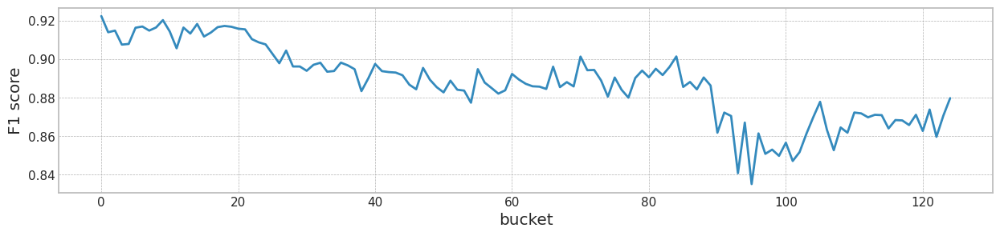

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,"Loan data, Feature 5",0.93452,0.922389,0.887604,0.879771,0.0


In [94]:
bucket_size_array=[10000]
X3 = X2[11497:]
Y3 = Y2[11497:]

for bucket_size in bucket_size_array:
    bucket_count = int(X3.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(X3[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = loan_model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y3[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s)
    plt.ylabel('F1 score')
    plt.xlabel('bucket')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Loan data, Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(0.0)

pd.DataFrame(result_table3)

### Concept-drift tolerant model 적용.

+ 1000개씩 한 bucket으로 만든다.

In [95]:
X2['b'] = [int(b/1000) for b in X2.index.values]

In [96]:
X2

,last_pymnt_amnt,total_rec_late_fee,int_rate,fico_range_high,term,b
0,-0.397694,-0.192655,0.496776,-0.962345,-0.584125,0
1,-0.554102,-0.192655,0.082156,1.265854,-0.584125,0
2,2.028986,-0.192655,0.806996,-0.126771,-0.584125,0
3,-0.475459,-0.192655,1.221617,-1.519395,-0.584125,0
4,-0.435187,-0.192655,-0.022245,1.126591,-0.584125,0
...,...,...,...,...,...,...
1279675,-0.624948,1.786667,-0.588993,-0.405296,-0.584125,1279
1279676,2.186015,-0.192655,-0.588993,0.569542,-0.584125,1279
1279677,1.704188,-0.192655,-1.173638,-0.266033,-0.584125,1279
1279678,6.143207,-0.192655,-1.964102,1.683641,-0.584125,1279


lambda_f2 1.0
cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.724354]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.665190]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.599653]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.527727]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.467327]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.419989]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.384912]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.360179]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.343407]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.332328]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.324962]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.319734]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.315751

100%|██████████| 125/125 [00:26<00:00,  4.73it/s]


mean of drift:
last_pymnt_amnt       0.213426
total_rec_late_fee    0.955045
int_rate              0.188050
fico_range_high       0.301125
term                  0.745600
dtype: float64
Mean F1 for all data: 0.8905797101897889
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 16.383329] [G loss: 0.388546]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 33.357388] [G loss: 0.324010]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 51.171925] [G loss: 0.300772]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 73.978828] [G loss: 0.284663]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 85.577850] [G loss: 0.281436]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 90.959877] [G loss: 0.279903]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 94.417526] [G loss: 0.278759]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 98.550461] [G loss: 0.277637]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 103.081055] [G loss: 0.276453]
[Lambda: 0.000

100%|██████████| 125/125 [00:26<00:00,  4.79it/s]


mean of drift:
last_pymnt_amnt       0.533034
total_rec_late_fee    0.964978
int_rate              0.917650
fico_range_high       1.000000
term                  0.759330
dtype: float64
Mean F1 for all data: 0.8252747368364011
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.192696] [G loss: 0.609008]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.433939] [G loss: 0.478959]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.449395] [G loss: 0.396822]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.385702] [G loss: 0.354101]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.319185] [G loss: 0.329637]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.260796] [G loss: 0.315037]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.213045] [G loss: 0.305786]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.175497] [G loss: 0.299143]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.144813] [G loss: 0.294631]
[Lambda: 0.100000] [Epoc

100%|██████████| 125/125 [00:26<00:00,  4.73it/s]


mean of drift:
last_pymnt_amnt       0.578810
total_rec_late_fee    0.946527
int_rate              0.713070
fico_range_high       0.572302
term                  0.743333
dtype: float64
Mean F1 for all data: 0.70198728646536
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.035563] [G loss: 0.635897]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.082266] [G loss: 0.540830]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.118322] [G loss: 0.450368]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.116403] [G loss: 0.393323]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.100365] [G loss: 0.358640]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.083437] [G loss: 0.336441]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.069621] [G loss: 0.321588]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.059399] [G loss: 0.311011]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.050663] [G loss: 0.303666]
[Lambda: 0.200000] [Epoch 

100%|██████████| 125/125 [00:26<00:00,  4.78it/s]


mean of drift:
last_pymnt_amnt       0.565996
total_rec_late_fee    0.942385
int_rate              0.833459
fico_range_high       0.560446
term                  0.743997
dtype: float64
Mean F1 for all data: 0.739587977764953
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.012319] [G loss: 0.643967]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.025470] [G loss: 0.560689]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.039514] [G loss: 0.477414]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.043155] [G loss: 0.416610]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.039500] [G loss: 0.376166]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.033569] [G loss: 0.349686]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.029156] [G loss: 0.330658]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.024907] [G loss: 0.318080]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.021528] [G loss: 0.309360]
[Lambda: 0.300000] [Epoch

100%|██████████| 125/125 [00:25<00:00,  4.81it/s]


mean of drift:
last_pymnt_amnt       0.570214
total_rec_late_fee    0.945394
int_rate              0.595110
fico_range_high       0.494279
term                  0.743327
dtype: float64
Mean F1 for all data: 0.7209769200060538
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.005593] [G loss: 0.647864]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.010399] [G loss: 0.569309]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.015953] [G loss: 0.490455]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.017826] [G loss: 0.430119]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.016719] [G loss: 0.387850]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.014283] [G loss: 0.359332]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.011923] [G loss: 0.340063]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.010094] [G loss: 0.326957]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.008924] [G loss: 0.317659]
[Lambda: 0.400000] [Epoc

100%|██████████| 125/125 [00:26<00:00,  4.74it/s]


mean of drift:
last_pymnt_amnt       0.566690
total_rec_late_fee    0.944627
int_rate              0.534774
fico_range_high       0.441969
term                  0.742278
dtype: float64
Mean F1 for all data: 0.7344388525679668
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.003021] [G loss: 0.650154]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.004706] [G loss: 0.574274]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.007072] [G loss: 0.497948]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.007996] [G loss: 0.438003]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.007624] [G loss: 0.394823]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.006519] [G loss: 0.365149]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.005376] [G loss: 0.344976]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.004486] [G loss: 0.331312]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.003996] [G loss: 0.321530]
[Lambda: 0.500000] [Epoc

100%|██████████| 125/125 [00:26<00:00,  4.79it/s]


mean of drift:
last_pymnt_amnt       0.557786
total_rec_late_fee    0.942333
int_rate              0.427288
fico_range_high       0.379386
term                  0.743314
dtype: float64
Mean F1 for all data: 0.7476789289017777
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.001892] [G loss: 0.651659]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.002231] [G loss: 0.577488]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.003174] [G loss: 0.502873]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.003597] [G loss: 0.443292]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.003453] [G loss: 0.399556]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.002967] [G loss: 0.368980]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.002433] [G loss: 0.348126]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.002001] [G loss: 0.334092]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.001767] [G loss: 0.324172]
[Lambda: 0.600000] [Epoc

100%|██████████| 125/125 [00:26<00:00,  4.72it/s]


mean of drift:
last_pymnt_amnt       0.535857
total_rec_late_fee    0.943018
int_rate              0.341514
fico_range_high       0.349802
term                  0.743333
dtype: float64
Mean F1 for all data: 0.7832387046781134
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.001372] [G loss: 0.652717]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001097] [G loss: 0.579736]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001364] [G loss: 0.506365]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.001511] [G loss: 0.447139]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.001459] [G loss: 0.403073]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.001260] [G loss: 0.371863]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.001028] [G loss: 0.350451]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000835] [G loss: 0.336071]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000730] [G loss: 0.326002]
[Lambda: 0.700000] [Epoc

100%|██████████| 125/125 [00:26<00:00,  4.72it/s]


mean of drift:
last_pymnt_amnt       0.514592
total_rec_late_fee    0.944546
int_rate              0.279706
fico_range_high       0.322718
term                  0.744782
dtype: float64
Mean F1 for all data: 0.8242773607700369
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.001135] [G loss: 0.653509]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000579] [G loss: 0.581403]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000535] [G loss: 0.508960]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000545] [G loss: 0.450038]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000518] [G loss: 0.405774]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000445] [G loss: 0.374093]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000362] [G loss: 0.352222]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000292] [G loss: 0.337546]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000253] [G loss: 0.327417]
[Lambda: 0.800000] [Epoc

100%|██████████| 125/125 [00:25<00:00,  4.81it/s]


mean of drift:
last_pymnt_amnt       0.477038
total_rec_late_fee    0.945298
int_rate              0.244608
fico_range_high       0.301656
term                  0.745330
dtype: float64
Mean F1 for all data: 0.8802710533012117
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 1.250311] [G loss: 0.741984]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.001041] [G loss: 0.654128]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000370] [G loss: 0.582690]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000197] [G loss: 0.510964]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000146] [G loss: 0.452306]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000123] [G loss: 0.407915]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000102] [G loss: 0.375859]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000082] [G loss: 0.353613]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000066] [G loss: 0.338686]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000057] [G loss: 0.328494]
[Lambda: 0.900000] [Epoc

100%|██████████| 125/125 [00:26<00:00,  4.77it/s]


mean of drift:
last_pymnt_amnt       0.388444
total_rec_late_fee    0.944531
int_rate              0.209871
fico_range_high       0.298638
term                  0.745600
dtype: float64
Mean F1 for all data: 0.9201174417374804


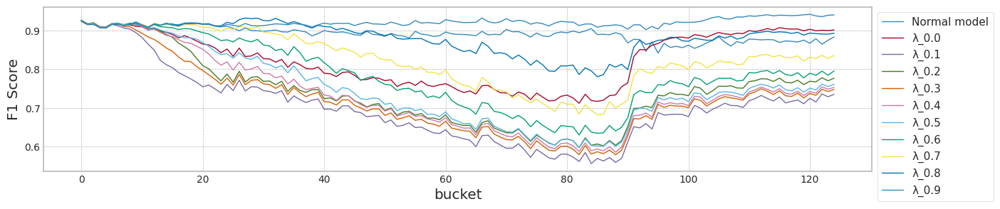

                     lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Loan data, Normal model  0.934385  0.923261  0.890580  0.883238  0.000000
1                       0.0  0.934062  0.924589  0.825275  0.901117  0.024119
2                       0.1  0.936865  0.925285  0.701987  0.735266  0.017452
3                       0.2  0.935262  0.925393  0.739588  0.776826  0.012048
4                       0.3  0.935740  0.926531  0.720977  0.747668  0.012574
5                       0.4  0.936416  0.926053  0.734439  0.752838  0.012571
6                       0.5  0.936800  0.925801  0.747679  0.760710  0.012502
7                       0.6  0.936554  0.925697  0.783239  0.795583  0.011399
8                       0.7  0.936599  0.925783  0.824277  0.835582  0.009782
9                       0.8  0.935925  0.925100  0.880271  0.892774  0.008947
10                      0.9  0.935205  0.925254  0.920117  0.939999  0.005937
max_mean_lambda= 0.9


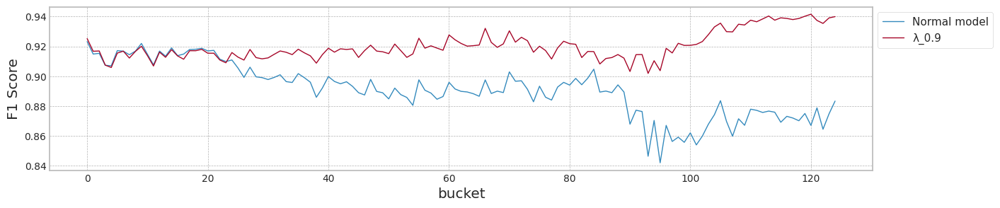

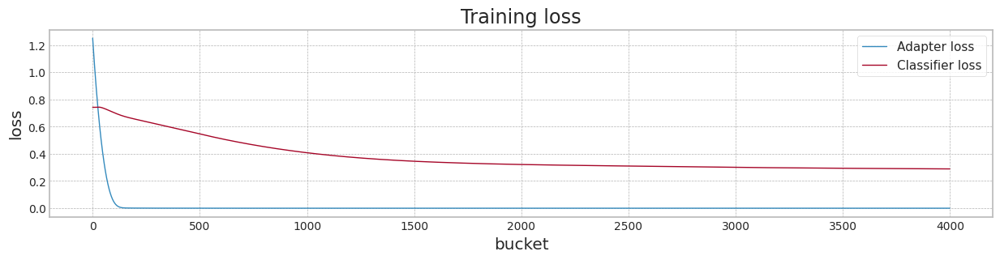

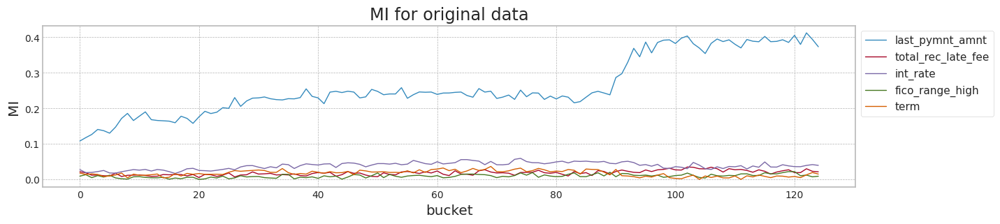

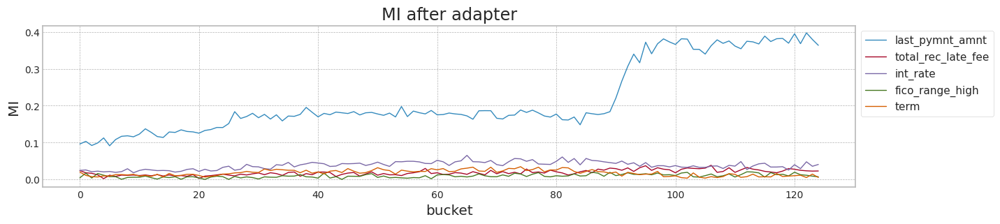

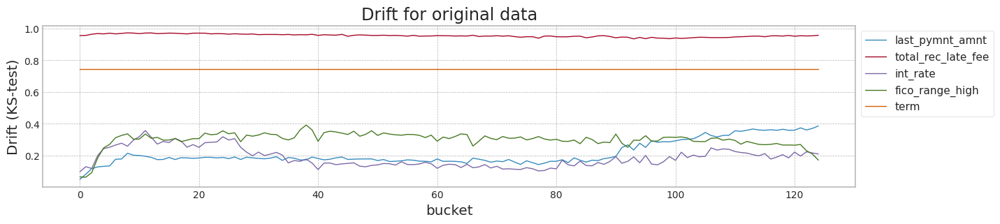

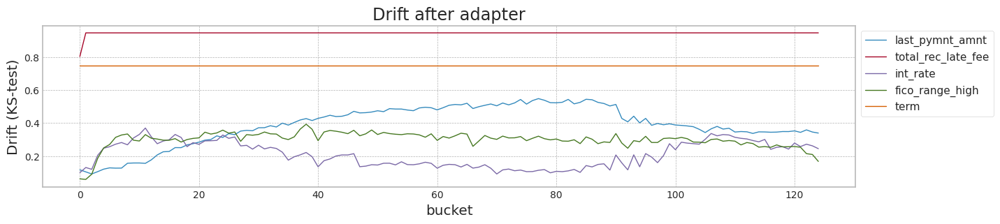

In [97]:
avaible_range = np.max(X2['b'])
seed = 1

train_tensors = Namespace(XS_train = torch.tensor(X2[0:10000].values, dtype=torch.float32),
                          y_train = torch.tensor(Y2[0:10000], dtype=torch.float32),
                          s1_train = torch.tensor(X2[0:10000][:0].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X2[10000:11497].values, dtype=torch.float32),
                         y_test = torch.tensor(Y2[10000:11497], dtype=torch.float32),
                         s1_test = torch.tensor(X2[10000:11497][:0].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

columns = top_columns

#train_df = pd.DataFrame(X[2010][:,top_columns_index],columns=columns)
#live_df = pd.DataFrame(X2[:,top_columns_index+[81]],columns=columns+['b'])

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2
    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:

        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,
                                          X2[0:10000][top_columns],
                                          X2[11497:],
                                          Y2[11497:],
                                          bucket_size_array=[10000])
        if lambda_f < 0.0:
            result_table2['lambda'].append("Loan data, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()